# CS109a Final Project - Galaxy Classification

##### Authors - John DiNovi, Santiago Calderon, Caleb Painter, Adam Boesky
___

# Table of Contents
#### 1. Introduction, Motivation, Problem Description
#### 2. Data Decription, EDA, Data Cleaning
#### 3. Modeling Process
#### 4. Results, Discussion, Future Considerations
___

## 1. Introduction, Motivation, Problem Description (Caleb)

![alt text](../other/IMG_0097.jpg)

Galaxy classification is a central part of astrophysics and cosmology. Knowing a galaxy's category (also known as class) gives us crucial information about its evolution, interactions, and the properties of the stars within. Different classes of galaxies contain stars of varying ages and compositions. For example, elliptical galaxies are typically older and formed from the merging of smaller galaxies, while spiral galaxies like the Milky Way are younger and have distinct star-forming regions. The classification can reveal the dynamic processes within a galaxy, such as the presence of active galactic nuclei, black holes, and the influence of gravitational interactions with nearby galaxies. Looking beyond just indivudal galaxies, understanding galaxy classification helps in mapping the large-scale structure of the universe. For instance, elliptical galaxies are often found in the dense centers of galaxy clusters [Dubinsky et. al (1998)](https://iopscience.iop.org/article/10.1086/305901/fulltext/37968.text.html), while spirals are more commonly located in less dense regions. Mapping these regions and the galaxies within them can shed light on the nature of dark matter and dark energy. Building up large samples of galaxies with known classes helps us understand the history of the universe, from the very beginning to present day. 

We are currently in a golden age of astronomical discovery, with a wealth of observational data becoming more and more readily available. Programs like the Hubble Space Telescope (HST) and the Sloan Digital Sky Survey (SDSS) have been able to conduct large scale observations of millions of galaxies in the night sky. Other projects like the Dark Energy Spectroscopic Instrument (DESI) are collecting spectroscopic data for many of these galaxies as well, from which many of their properties can be inferred. Having a way to efficiently and accurately classify these galaxies based on this data will be incredibly important in the upcoming years, and will be of invaluable help to answering a variety of astronomical questions. Machine learning tools are one of the best ways to tackle this important issue. 

In this notebook, we develop, tune, and deploy several models to predict galaxy class from their features. In doing so, we also recover known astronomical relations from our data and gain insight into which features are most important in determining a galaxy's class. We train our model on a catalog of ~900 nearby galaxies, for which properties like mass, size, rotational velocity, and different spectral emission lines are recorded, alongisde the type of each one. Our goal is to use these features to predict the galaxy's morphological class.

___

## 2. Data Description, EDA, Data Cleaning (Everyone add their parts)

We checked the distribution of our three main galaxy types, to see if we would need to correct for any imbalance later on when making predictions. 

In [136]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import (LogisticRegression, LinearRegression)
from sklearn.metrics import confusion_matrix, roc_curve, auc, accuracy_score
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.multiclass import OneVsRestClassifier 
from sklearn.model_selection import GridSearchCV
from sklearn.utils import resample
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE, RandomOverSampler
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier, XGBRegressor
from sklearn.impute import (KNNImputer, MissingIndicator)

from modeling_utils import Custom_Classifier

# pandas tricks for better display
pd.options.display.max_columns = 50  
pd.options.display.max_rows = 500     
pd.options.display.max_colwidth = 100
pd.options.display.precision = 3

# pandas tricks for better display
pd.set_option('display.width', 1500)
pd.set_option('display.max_columns', 100)

# Silence FutureWarnings
import warnings
from pandas.errors import SettingWithCopyWarning
annoying_warnings = [FutureWarning, SettingWithCopyWarning]
for pain_in_butt in annoying_warnings:
    warnings.filterwarnings(action='ignore', category=pain_in_butt)

### Read in Data

### Dataset Used

The largest challenge we faced with this project was figuring out what dataset we could use. Our original plan was to download a set of ~20,000 galaxies from the [Galaxy Zoo](https://ui.adsabs.harvard.edu/abs/2008MNRAS.389.1179L/abstract), which are labeled with their ‘type’, falling into categories like ‘spiral’, ‘merging’, ‘edge-on’, and more. The goal was to then cross-match these with galaxies from the [DESI Legacy Survey](https://www.legacysurvey.org/dr10/description/), which records photometric properties for each galaxy, as well as estimates on the mass. While downloading the Galaxy Zoo data was very easy, we had many difficulties in getting the DESI data. The initial site we were planning to download the data from ended up not working, and while we were able to find a different catalog compiled by [Zou et al. (2019)](https://iopscience.iop.org/article/10.3847/1538-4365/ab1847), downloading this catalog proved very difficult. It ended up being 40 Gb large, and performing a cross match on such a large database was not feasible.

Instead, we decided to turn to a different database, the Updated Nearby Galaxy Catalog, compiled by [Karachentsev et al. 2013](https://ui.adsabs.harvard.edu/abs/2013AJ....145..101K/abstract). While this dataset was smaller than the previous ones, it had the photometric properties, mass, other characteristics, and galaxy type all in one place. This was fairly easy to download and was what we used for the rest of the project.

We first download the catalog in its raw form:

In [137]:
galaxies_df = pd.read_csv('../data/asu(4).tsv',delimiter=';',skiprows=104)
galaxies_df = galaxies_df.drop([0,1])  # drop useless rows
galaxies_df.head()

,_RAJ2000,_DEJ2000,Name,Nd,RAJ2000,DEJ2000,a26,l_FUV,FUV,Bmag,l_Hamag,Hamag,Kmag,l_HImag,HImag,W50,TT,Mcl,Tdw,HRV,Dist,A26,i,vAmp,<Bmu>,M26,l_MHI,MHI,Vlg,Ti5,K+04,SimbadName
2,000.093750,+39.495556,UGC12894,7,00 00 22.5,+39 29 44,1.02,,17.57,16.80,,19.91,14.02,,15.66,34,10,Ir,L,335,8.47,2.78,33,21,25.2,8.17,,7.92,619,-1.2,0,UGC12894
3,000.492083,-15.461111,WLM,8,00 01 58.1,-15 27 40,11.48,,12.80,11.03,,15.56,9.00,,11.19,53,9,Im,N,-122,0.97,3.21,90,22,24.8,8.27,,7.83,-16,0.2,1,WLM GALAXY
4,000.560417,+45.088889,And XVIII,4,00 02 14.5,+45 05 20,1.40,>,23.00,17.00,,,12.49,,,,-3,Sph,L,-332,1.36,0.63,10,,26.2,,,,-44,0.5,0,And XVIII
5,001.382500,-28.098056,ESO409-015,7,00 05 31.8,-28 05 53,1.20,,16.08,15.15,,17.21,12.74,,15.28,53,9,Im,N,726,7.70,2.65,78,23,24.1,8.20,,7.99,769,-1.2,0,ESO409-015
6,001.643333,+15.510833,AGC748778,6,00 06 34.4,+15 30 39,0.32,,20.28,18.90,,,16.29,,18.21,16,10,Ir,L,258,5.40,0.53,70,3,24.9,5.64,,6.51,486,-1.3,0,AGC748778


We see from the start that there are many rows with missing geatures, as well as some features which have almost no associated values. After some research onto each feature and its astrophysical contribution, we decide on which features we can drop as not important (ones like position on the sky, RAJ2000 and DEJ2000, or Name). We settle on the following features, and examine the proportions missing for each one. 

Our new dataset looks more compact, with more relevant features:

In [138]:
categorical_vars = ['TT','Mcl']
ordinal_vars = ['Tdw']
quantitative_vars = ['FUV','Bmag','Hamag','Kmag','HImag','W50','HRV','Dist','A26','i','vAmp','<Bmu>','M26','MHI','Vlg','Ti5']

all_features = categorical_vars + ordinal_vars + quantitative_vars


galaxies_df = galaxies_df[all_features]
galaxies_df.head()

,TT,Mcl,Tdw,FUV,Bmag,Hamag,Kmag,HImag,W50,HRV,Dist,A26,i,vAmp,<Bmu>,M26,MHI,Vlg,Ti5
2,10,Ir,L,17.57,16.80,19.91,14.02,15.66,34,335,8.47,2.78,33,21,25.2,8.17,7.92,619,-1.2
3,9,Im,N,12.80,11.03,15.56,9.00,11.19,53,-122,0.97,3.21,90,22,24.8,8.27,7.83,-16,0.2
4,-3,Sph,L,23.00,17.00,,12.49,,,-332,1.36,0.63,10,,26.2,,,-44,0.5
5,9,Im,N,16.08,15.15,17.21,12.74,15.28,53,726,7.70,2.65,78,23,24.1,8.20,7.99,769,-1.2
6,10,Ir,L,20.28,18.90,,16.29,18.21,16,258,5.40,0.53,70,3,24.9,5.64,6.51,486,-1.3


Here is the final list of our predictors. Some of them were astrophysical properties we weren't familiar with, and which we had to look more into to fully understand their importance. 

Our response variables were:

    TT: Morphological type --> This is the Hubble stage of a galaxy, which can be grouped into appropriate Hubble classes (Spiral, Lenticular, Irregular)

    Mcl: Dwarf galaxy morphology --> Some galaxies in the sample are dwarf galaxies and can be further classified as to what kind of dwarf they are

Our Predictor Variables were:

    Tdw: Dwarf galaxy surface brightness morphology

    FUV: Far UV

    Bmag: Apparent integral b-band magnitude

    Hamag: Integral H-alpha line emission magnitude

    Kmag: K-band magnitude

    HImag: HI 21cm line magnitude

    W50: HI Line width at 50% level from maximum

    HRV: Heliocentric radial velocity

    Dist: linear distance to galaxy from the sun (heiocentric)

    A26: major linear diameter

    i: inclination of galaxy from the face on

    vAmp: amplitude of rotational velocity

    Bmu: average b-band surface brightness

    M26: log-mass within the Holmberg radius

    MHI: log-Hydrogen mass

    Vlg: local group radial velocity

    Ti5: tidal index


These predictors are all astrophysical properties that we hope to use to predict galaxy type. Many of our galaxies still had missing features, as can be seen in the plot below.





/var/folders/8w/z7zsz3tj76jd_p19pfzbwj5c0000gn/T/ipykernel_43953/3367484156.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(all_features,rotation = 45, ha="right")


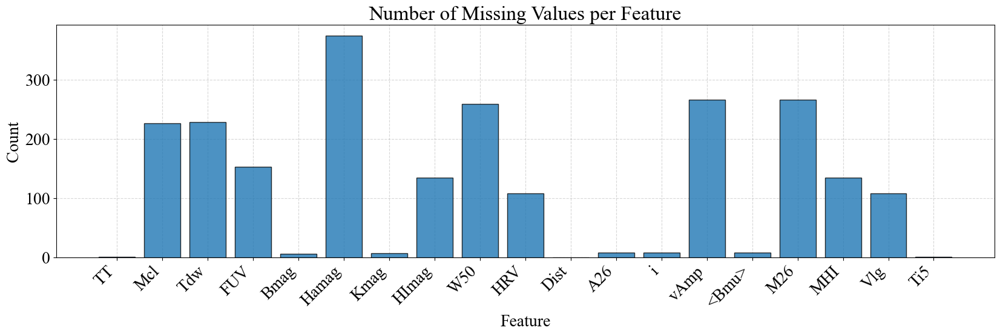

In [139]:
missing_num = []
for i in all_features:
    str_array = np.char.mod('%s', np.array(galaxies_df[i]).flat)
    whitespace_count = np.sum(np.char.isspace(str_array))
    missing_num.append(whitespace_count)

plt.rcParams["figure.figsize"] = (20,5)
plt.rcParams["font.size"] = 20

plt.bar(x=all_features,height=missing_num,zorder=3,edgecolor='black',color='tab:blue',alpha=.8)

# highlight each galaxy type

plt.xlabel("Feature")
plt.gca().set_xticklabels(all_features,rotation = 45, ha="right")
plt.ylabel("Count")
plt.title("Number of Missing Values per Feature")
plt.grid(alpha=.5,ls='--',zorder=0)
plt.show()

We decided to drop any rows with more than 50% of the features missing, after which we were left with 864 galaxies. To do this we had to reformat our data, stripping whitespace and converting string values to floats in order to make sure our numerical computations could be carried out. 

In [140]:
for col in quantitative_vars:
    galaxies_df[col] = galaxies_df[col].apply(lambda x: float(x.strip()) if (isinstance(x, str) and x.strip() != '') else np.nan)

# Drop anything without response variables
half_col_count = len(quantitative_vars) * 0.5
dropped_gal_df = galaxies_df.dropna(subset=quantitative_vars, thresh=half_col_count, inplace=False)
print(f'Dropped {len(galaxies_df) - len(dropped_gal_df)} rows from initial {len(galaxies_df)}')

Dropped 5 rows from initial 869


For the features with missing data points, we recorded which values were imputed. We then impute these missing values with a k=5 KNN Imputer. We choose kNN because it is more context-sensitive which is important in galaxy classification, as it uses the most similar observations to maintain the inherent structure of the data.
By leveraging actual observed values from similar instances, kNN better preserves the original data distribution and variability compared to other and more simple imputation methods. kNN is particularly important for us because it is effective for multivariate data where the missing value imputation should consider several features, capturing complex relationships between features, as is likely the case in galaxy properties. 

In [141]:
# Check where missing values are and save all their locations
indicator = MissingIndicator(missing_values=np.NaN, features="all")
missing = indicator.fit_transform(dropped_gal_df)
missing_df = pd.DataFrame(columns=dropped_gal_df.columns, data=missing)
missing_df.head()

,TT,Mcl,Tdw,FUV,Bmag,Hamag,Kmag,HImag,W50,HRV,Dist,A26,i,vAmp,<Bmu>,M26,MHI,Vlg,Ti5
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,True,False,True,True,False,False,False,False,True,False,True,True,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False


In [142]:
# Impute remaining mising values with KNN
imputer = KNNImputer(n_neighbors=5)
dropped_gal_df[quantitative_vars] = imputer.fit_transform(dropped_gal_df[quantitative_vars])
dropped_gal_df.reset_index(inplace=True)

This is the final pre-processed version of our database that we will be working with.

In [143]:
# Read in the data
processed_galaxies_df = pd.read_csv('../data/preprocessed_data.csv')
processed_galaxies_df= processed_galaxies_df.drop(['Unnamed: 0', 'index'], axis=1)

In [144]:
# Read in data that includes indicator for imputed values
missingness = pd.read_csv('../data/missingness.csv')
missingness= missingness.drop(['Unnamed: 0'], axis=1)

In [145]:
processed_galaxies_df.head()

,TT,Mcl,Tdw,FUV,Bmag,Hamag,Kmag,HImag,W50,HRV,Dist,A26,i,vAmp,<Bmu>,M26,MHI,Vlg,Ti5
0,10,Ir,L,17.57,16.80,19.910,14.02,15.66,34.0,335.0,8.47,2.78,33.0,21.0,25.2,8.170,7.920,619.0,-1.2
1,9,Im,N,12.80,11.03,15.560,9.00,11.19,53.0,-122.0,0.97,3.21,90.0,22.0,24.8,8.270,7.830,-16.0,0.2
2,-3,Sph,L,23.00,17.00,24.098,12.49,18.32,131.8,-332.0,1.36,0.63,10.0,66.4,26.2,8.436,6.688,-44.0,0.5
3,9,Im,N,16.08,15.15,17.210,12.74,15.28,53.0,726.0,7.70,2.65,78.0,23.0,24.1,8.200,7.990,769.0,-1.2
4,10,Ir,L,20.28,18.90,24.706,16.29,18.21,16.0,258.0,5.40,0.53,70.0,3.0,24.9,5.640,6.510,486.0,-1.3


We now investigate the proportion of each galaxy type that we have, to look for imbalances in our dataset. We also convert the Hubble Type TT to Hubble class. We used conditional assignments based on 'TT' values to categorize galaxies into lenticular (0), spiral (1), and irregular (2). This is important because it translates the Hubble Class into a numerical format suitable for our modeling. 

In [146]:
# Define a variable 'gal_type' that stores the type of galaxy 
processed_galaxies_df['hubble_class'] = 0
processed_galaxies_df['hubble_class'][(processed_galaxies_df['TT'] >= 0) & (processed_galaxies_df['TT'] <= 7)] = 1
processed_galaxies_df['hubble_class'][processed_galaxies_df['TT'] >  7] = 2
## ===== CODE: (0, 1, 2) = (lenticular, spiral, irregular) ===== ##

# Print the percent class breakdowns for each Hubble class
print("Portion Lenticular:", round(np.mean(processed_galaxies_df['hubble_class'] == 0), 3))
print("Portion Spiral:", round(np.mean(processed_galaxies_df['hubble_class'] == 1), 3))
print("Portion Irregular:", round(np.mean(processed_galaxies_df['hubble_class'] == 2), 3))
print("\n")

for i in range(-3, 12, 1):
    print(f"Total, Portion TT={i}:", f"{np.sum(processed_galaxies_df['TT'] == i)},", round(np.mean(processed_galaxies_df['TT'] == i), 3))

Portion Lenticular: 0.197
Portion Spiral: 0.124
Portion Irregular: 0.679


Total, Portion TT=-3: 109, 0.126
Total, Portion TT=-2: 25, 0.029
Total, Portion TT=-1: 36, 0.042
Total, Portion TT=0: 4, 0.005
Total, Portion TT=1: 8, 0.009
Total, Portion TT=2: 2, 0.002
Total, Portion TT=3: 8, 0.009
Total, Portion TT=4: 9, 0.01
Total, Portion TT=5: 9, 0.01
Total, Portion TT=6: 23, 0.027
Total, Portion TT=7: 44, 0.051
Total, Portion TT=8: 106, 0.123
Total, Portion TT=9: 126, 0.146
Total, Portion TT=10: 353, 0.409
Total, Portion TT=11: 2, 0.002


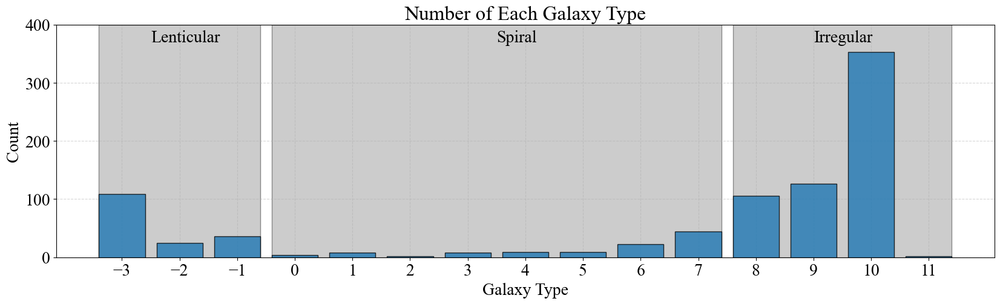

In [147]:
def get_elements(array):

    unique_elements, counts = np.unique(array, return_counts=True)
    count_array = np.zeros_like(unique_elements, dtype=int)
    for i, element in enumerate(unique_elements):
        count_array[i] = counts[i]
    try:
        unique_elements= [int(i) for i in unique_elements]
    except:
        pass
    combined = list(zip(unique_elements, count_array))
    sorted_combined = sorted(combined, key=lambda x: x[0])
    unique_elements, count_array = zip(*sorted_combined)
    return list(unique_elements),list(count_array)

unique_elements,count_array= get_elements(processed_galaxies_df['TT'])

plt.rcParams["figure.figsize"] = (20,5)
plt.bar(x=unique_elements,height=count_array,zorder=3,edgecolor='black',color='tab:blue',alpha=.8)
plt.xticks(unique_elements)

# highlight each galaxy type
plt.axvspan(-3.4,-.6,facecolor='grey',alpha=.4,linewidth=1,edgecolor='black')
plt.text(-2.5,370,s='Lenticular')
plt.axvspan(-.4,7.4,facecolor='grey',alpha=.4,linewidth=1,edgecolor='black')
plt.text(3.5,370,s='Spiral')
plt.axvspan(7.6,11.4,facecolor='grey',alpha=.4,linewidth=1,edgecolor='black')
plt.text(9,370,s='Irregular')
plt.ylim(0,400)

plt.xlabel("Galaxy Type")
plt.ylabel("Count")
plt.title("Number of Each Galaxy Type")
plt.grid(alpha=.5,ls='--',zorder=0)
plt.show()



 Our galaxy dataset is imbalanced—the breakdown of the galaxy classes is 19.7% lenticular, 12.3% spiral, and 69.9% irregular. Class imbalance can lead to a biased classification model that overly favors the majority class. We will use SMOTE to help mitigate this issue by generating synthetic samples for the minority classes to balance the class distribution. SMOTE is a good choice for us because it interpolates between existing minority class instances. This approach helps in creating a more diverse and representative sample of the minority class. By generating these new samples instead of just duplicating existing ones, SMOTE helps reduce the risk of overfitting that is common with simple oversampling. Overall it builds a more balanced decision boundary, which improves classification performance

We applied StandardScaler to our quantitative predictors to normalize the training and testing sets. As we discussed in class, standardization is crucial because it ensures that predictors have equal weight. This is particularly important to our project because many of our classification metrics and features have different units and scales. 

In [148]:
# Instantiate the list of the quantitative predictors
quant_preds = processed_galaxies_df.select_dtypes(include=['number']).columns.drop(['TT', 'hubble_class'])

# Split into train and test sets for hubble class
X_train, X_test, y_train_hubble, y_test_hubble, y_train_TT, y_test_TT = train_test_split(processed_galaxies_df[quant_preds], processed_galaxies_df['hubble_class'], processed_galaxies_df['TT'], random_state=109, test_size=0.2, shuffle=True)

# Instantiate a scaler
standardscaler = StandardScaler().fit(X_train)

# Standardize the data
X_train_std = standardscaler.transform(X_train)
X_test_std = standardscaler.transform(X_test)

# Define a dictionary to store the train and test accuracies of the optimal models throughout this notebook
hubble_accuracies = {}

### Preliminary EDA

We then perform some initial EDA on this dataset.

/Users/caleb/opt/anaconda3/envs/cs109a/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


KeyboardInterrupt: 

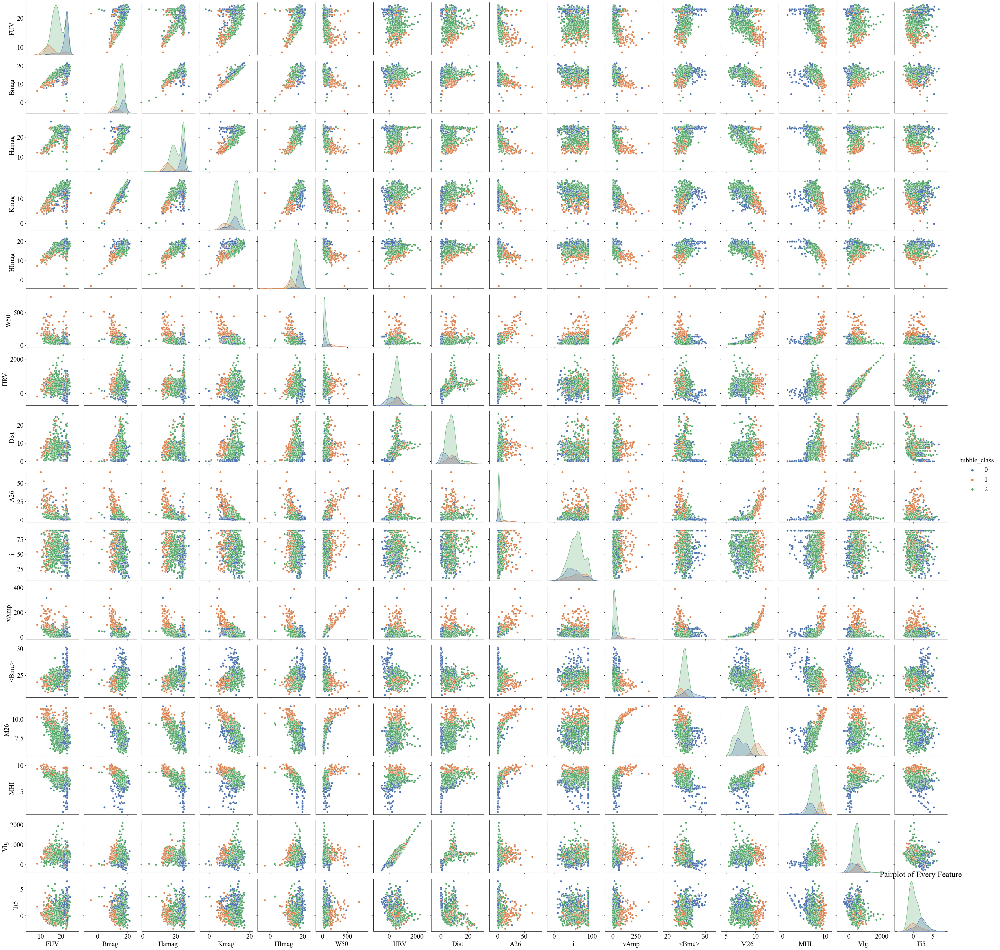

In [149]:
# We start just by construting a large pairplot, and looking to see if any of our features are very correlated or cluster the different galaxy types well
sns.pairplot(pd.concat([processed_galaxies_df[quant_preds], processed_galaxies_df['hubble_class']], axis=1), x_vars=quant_preds, y_vars=quant_preds, hue='hubble_class',palette="deep")
plt.title("Pairplot of Every Feature")
plt.savefig('/Users/caleb/Downloads/sns.png')

Text(0.5, 0.98, 'Correlated Features')

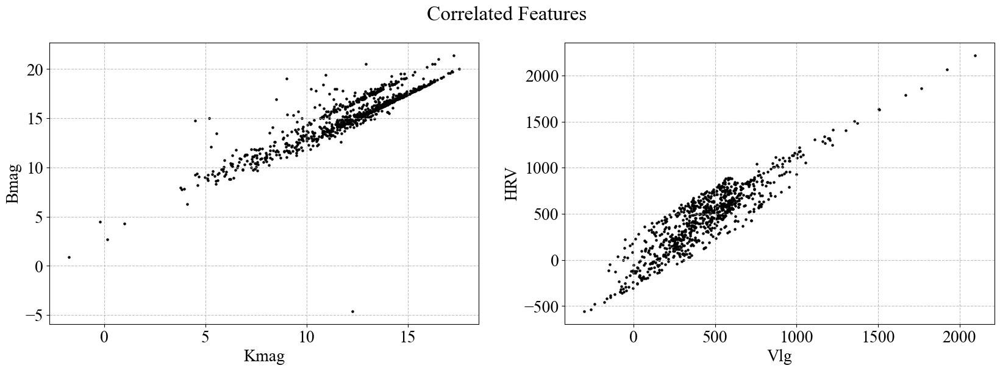

In [ ]:
fig, axs = plt.subplots(1,2,figsize=(20,6))

axs[1].scatter(processed_galaxies_df['Vlg'],processed_galaxies_df['HRV'],color='black',s=5)
axs[1].grid(alpha=.8,ls='--')
axs[1].set_xlabel("Vlg")
axs[1].set_ylabel("HRV")

axs[0].scatter(processed_galaxies_df['Kmag'],processed_galaxies_df['Bmag'],color='black',s=5)
axs[0].grid(alpha=.8,ls='--')
axs[0].set_xlabel("Kmag")
axs[0].set_ylabel("Bmag")

plt.suptitle("Correlated Features")

We see that some of our features are highly correlated. As one example, Vlg and HRV are highly correlated, likely because they both represent galaxy velocites, although one is radial and the other heliocentric.

We also look to see if we can recover known astronomical relations from our data. 

/Users/caleb/opt/anaconda3/envs/cs109a/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


Slope:  74.66490866264812


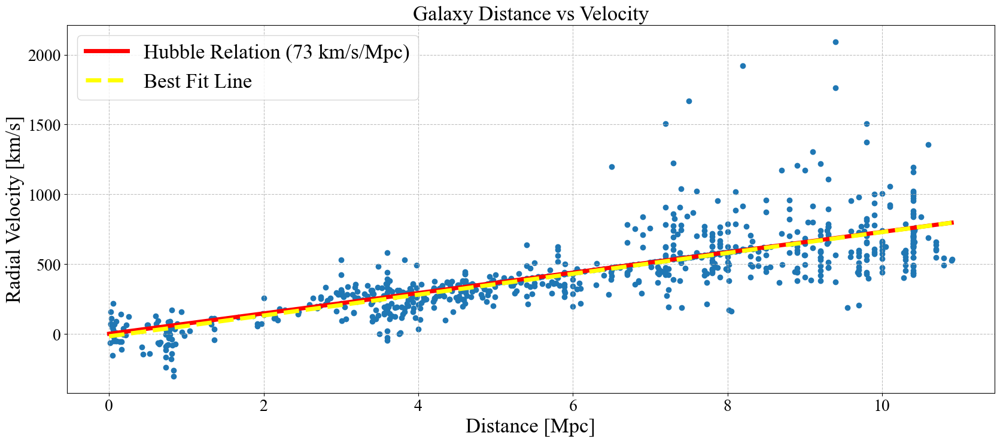

In [ ]:
# recovering known astronomical relations       
plt.rcParams["font.family"] = "Times New Roman"


plt.figure(figsize=(20,8))

hubble_galaxies = processed_galaxies_df[processed_galaxies_df['Dist'] < 11]

plt.scatter(hubble_galaxies['Dist'],hubble_galaxies['Vlg'])
plt.tick_params(labelsize=20)
plt.xlabel("Distance [Mpc]",fontsize=25)
plt.ylabel("Radial Velocity [km/s]",fontsize=25)
x = np.arange(0,11,.1)
y = 73*x
plt.plot(x,y,color='red',label=r'Hubble Relation (73 km/s/Mpc)',linewidth=5)
model = LinearRegression()

# Fitting the model to the data
model.fit(hubble_galaxies['Dist'].to_frame(), hubble_galaxies['Vlg'].to_frame())

# Making predictions
y_pred = model.predict(x.reshape(-1,1))

plt.plot(x,y_pred,color='yellow',label='Best Fit Line',linewidth=5,ls='--')

plt.grid(ls='--',alpha=.8)

plt.legend(fontsize=25)

plt.title("Galaxy Distance vs Velocity",fontsize=25)
print("Slope: ",model.coef_[0][0])



Here we plot our galaxy distances vs their radial velocities. The radial velocity represents the velocity of the galaxy as it is moving away from us. It's measured by looking at the redshifts of well-known spectral emission lines. We see that as distance increases so does the radial velocity. This suggests that further away galaxies from us are moving faster. In this way, it seems like we are at the center of an expanding universe. However, the Copernican principle (which says that really we aren't all that special) points to an other interpretation: every galaxy in the universe is moving away from every other galaxy, so the universe is expanding! The rate of this expansion is captured by a value called the Hubble constant, first measured in the late 1920s. The current best estimates place this value at around 73 km/s/Mpc (so galaxies 1Mpc away from us move away at a speed of 73km/s). The galaxies in our sample fit this trend very well, as seen above. A best fit line to our data gives a Hubble constant of 74.7 km/s/Mpc. So we are indeed able to recover this known astronomical relation from our data.


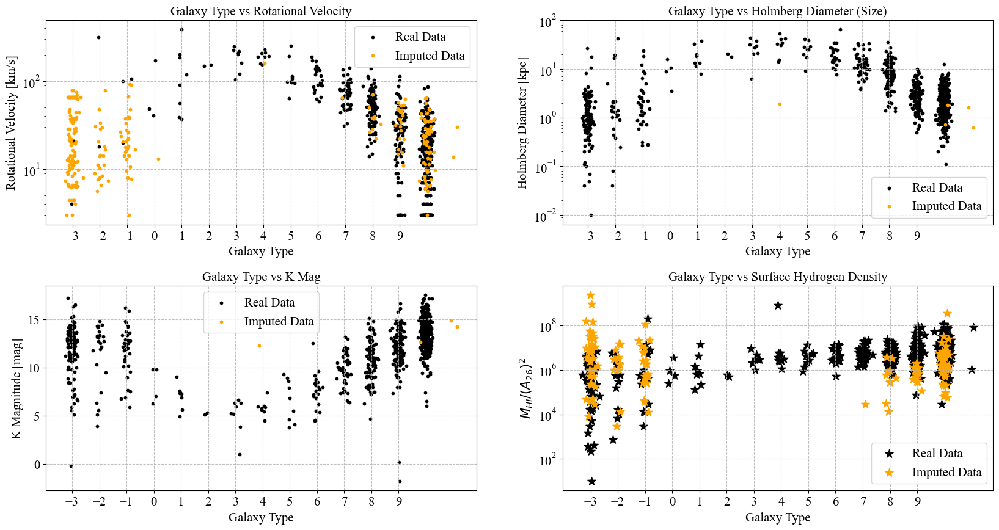

In [ ]:
fig, axs = plt.subplots(2,2,figsize=(20,10))


# vAmp
indexes = np.where(np.array(missingness['vAmp']==False) == True)
imp_indexes = np.where(np.array(missingness['vAmp']==False) == False)
jitter = np.random.normal(0, .1, len(indexes[0]))
axs[0,0].scatter(np.array(processed_galaxies_df['TT'])[indexes]+jitter,np.array(processed_galaxies_df['vAmp'])[indexes],s=10,color='black',label='Real Data')
jitter = np.random.normal(0, .1, len(imp_indexes[0]))
axs[0,0].scatter(np.array(processed_galaxies_df['TT'])[imp_indexes]+jitter,np.array(processed_galaxies_df['vAmp'])[imp_indexes],s=10,color='orange',label='Imputed Data')


axs[0,0].set_ylabel("Rotational Velocity [km/s]",fontsize=15)
axs[0,0].set_title('Galaxy Type vs Rotational Velocity',fontsize=15)



#A26
indexes = np.where(np.array(missingness['A26']==False) == True)
imp_indexes = np.where(np.array(missingness['A26']==False) == False)

jitter = np.random.normal(0, .1, len(indexes[0]))
axs[0,1].scatter(np.array(processed_galaxies_df['TT'])[indexes]+jitter,np.array(processed_galaxies_df['A26'])[indexes],s=10,color='black',label='Real Data')
jitter = np.random.normal(0, .1, len(imp_indexes[0]))
axs[0,1].scatter(np.array(processed_galaxies_df['TT'])[imp_indexes]+jitter,np.array(processed_galaxies_df['A26'])[imp_indexes],s=10,color='orange',label='Imputed Data')

axs[0,1].set_ylabel("Holmberg Diameter [kpc]",fontsize=15)
axs[0,1].set_title("Galaxy Type vs Holmberg Diameter (Size)", fontsize=15)


# K-Mag
indexes = np.where(np.array(missingness['Kmag']==False) == True)
imp_indexes = np.where(np.array(missingness['Kmag']==False) == False)
jitter = np.random.normal(0, .1, len(indexes[0]))
axs[1,0].scatter(np.array(processed_galaxies_df['TT'])[indexes]+jitter,np.array(processed_galaxies_df['Kmag'])[indexes],s=10,color='black',label='Real Data')
jitter = np.random.normal(0, .1, len(imp_indexes[0]))
axs[1,0].scatter(np.array(processed_galaxies_df['TT'])[imp_indexes]+jitter,np.array(processed_galaxies_df['Kmag'])[imp_indexes],s=10,color='orange',label='Imputed Data')
axs[1,0].set_ylabel("K Magnitude [mag]",fontsize=15)
axs[1,0].set_title("Galaxy Type vs K Mag",fontsize=15)

# SFR
hydrogen_density = 10**processed_galaxies_df['MHI']/(processed_galaxies_df['A26']**2)
indexes = np.where(np.array(missingness['MHI']==False) == True)
imp_indexes = np.where(np.array(missingness['MHI']==False) == False)
jitter = np.random.normal(0, .1, len(indexes[0]))

axs[1,1].scatter(np.array(processed_galaxies_df['TT'])[indexes]+jitter,np.array(hydrogen_density)[indexes],s=100,color='black',label='Real Data',marker='*')
jitter = np.random.normal(0, .1, len(imp_indexes[0]))
axs[1,1].scatter(np.array(processed_galaxies_df['TT'])[imp_indexes]+jitter,np.array(hydrogen_density)[imp_indexes],s=100,color='orange',label='Imputed Data',marker='*')
axs[1,1].set_title("Galaxy Type vs Surface Hydrogen Density",fontsize=15)
axs[1,1].set_ylabel(r"$M_{HI}/(A_{26})^2$",fontsize=15)

for ax in axs.ravel():
    ax.tick_params(labelsize=15)
    ax.set_xlabel("Galaxy Type",fontsize=15)
    ax.grid(ls='--',alpha=.8)
    ax.set_yscale('log')
    ax.set_xticks(np.arange(-3,10,1))
    ax.tick_params(labelsize=15)
    ax.legend(fontsize=15)

axs[1,0].set_yscale('linear')

plt.subplots_adjust(hspace=.3)
plt.show()


Above we plotted a number of features we believe are important vs galaxy type, trying to see if they have any relationship and then trying to fundemantally understand the physics behind these relationships.

<ins>Upper Left</ins>: 

Here we see that the rotational velocities of our galaxies peaks around galaxy type 2-4, which correspond to early type siral galaxies. This makes sense, as these galaxies are typically larger in size and more massive, and thus show higher rotation curves. The spread in velocities for higher galaxy types (8-10) could be due to these being irregular, which often result from a collision of two galaxies thus leading to a larger range of possible rotational velocities.

It's also worth noting that one reason behind the larger spread could also just be the lack of data points for spiral galaxies, and the over-representation of irregular and lenticular galaxies in our sample. We also see that the majority of our galaxies with type <0 needed to have rotational velocities imputed. This is likely because these early-type galaxies have a lower gas content, which as a result can make it hard to accurately measure a rotational amplitude. As such our data is missing at random (not missing completelely at random), and so we don't draw any strong conclusions from the large spread and lower values of rotational velocities for these galaxies.

<ins>Upper Right</ins>: 

Again, we see that the Holmberg Diameter peaks around the Spiral galaxies. The holmberg diamater is a measure of the size of the galaxy based on its observed surface brightness (specifically the major-axis radius at a surface brightness of 26.5 photographic mag per arcsec^2). This makes sense to some degree as spiral galaxies have many young stars, contributing to a larger surface brightness.

<ins>Lower Left</ins>: 


The K wavelength band in astronomy is centered at 2.2 micrometers. This is out of the optical and into the infrared. Galaxies that emit strongly in the infrared are those that have high dust contents, as dust preferentially filters out the shorter wavelength light. This is the case for spiral galaxies, which have high dust contents. This can be seen in the above plot, where spiral galaxies have the lowest K Magnitude (which actually corresponds to being brighter in that band, an inverse relationship).

<ins>Lower Right</ins>: 

Here we see that there is somewhat of a relationship between galaxy type and the hydrogen mass divided by the length of the galaxy squared. It's been previously noted that this parameter (hydrogen mass/area, or average hydrogen surface density) is a good proxy for star formation rate (SFR) in a galaxy (Robert & Haynes 1994). We see that the average hydrogen surface density seems to increase for both larger galaxy types, corresponding to spiral and irregular galaxies. This makes sense with known galaxy type characteristics. Typically, irregular galaxies are of lower masses and luminosities than spiral ones, and are undergoing relatively intense star formation activity. Spiral galaxies also have higher star formation rates, with high contents of gas and dust in their disk and many young stars being born.

We also see that there is a spread in surface density at both ends of the morphological scale. Some of this can also be explained by galaxy evolution predictions; lenticular galaxies are theorized to potentially have large amounts of their hydrogen sweeped out (van den Bergh 2009), which could lead to a large spread in SFR.







___

## 3. Modeling Process (John and Adam)

### 3a) Considered Models


We considered a variety of models for our project to determine which would perform best at predicing the class of galaxies given our set of predictors.

* <u>__Multiple Logistic Regression with LASSO Regularization__</u>: We first considered a multiple logistic regression model with LASSO regularization. Mulitple logistic regression can be useful for multi-class problems on non-ordinal, categrical data, and is more interpretable than some other ML-based models. This is especially true with the LASSO regularization, which sends coefficient estimates and feature importances to zero when they provide less information. This can also help address potential colinearity issues, reducing the model's sensitivity to correlated features.

* <u>__Random Forest__</u>: For our second model we implementd a random forest, which like logistic regression, can be used for classication problems. We chose to explore the performance of random forests because of their ability to find complex, unique decision boundaries as a result of the non-parametric approach, and because of how intuitive it is to extract feature importance. Additionally, the random splits in random forests could help control for  multicollinearity in our features, which may be important as our "mag" features are all descriptions of galaxy brightnesses.

* <u>__Gradient Boosting__</u>: Lastly we implemented two versions of gradient boosting, sklearn Gradent Boosting and XGBoost. Gradient boosting has advantages from its ability to perform well on inbalanced data, which we see in our data set, and like random forests, may be able to find more complex decision boundaries than logistic regression from the non-parametric approach. Additionally, gradient boosting does well with outliears/difficult to classify points due to the fashion in which it weighs data---this is particularly valuable in galaxy classification, as galaxies are highly dynamic, complex systems which often contain clusters in hard-to-understand regions of the feature space. We decided to use two gradient boosting models because the sklearn model is the one that we use in our homeworks, but XGBoost is used throught industry becuase it is highly efficient, memory optimized, and uses regularization (which is good for datsets like ours with many predictors that may be irrelevant).

<u>__SMOTE and ROS__</u>: Our dataset is highly imbalanced. To handle underreperesented classes, we use the Synthetic Minority Oversampling Technique and Random Oversampling to account for this issue. For each model where we predict Hubble class, we consider the model trained with and without smote to correct for imbalance. For each model where we predict the TT class, we considered training with and without random oversampling because some subclasses had as few as two observations in the whole dataset, so SMOTE would have to use $k=2$ potentially muting class variability.

### 3b) Model Tuning


#### Multiple Logistic Regression with LASSO Regularization, Tuned with CV (k=10)

In [ ]:
# Parameters to tune with CV
param_grid = {'C': np.logspace(-4, 4, 20)}

# Base classifier
logreg_base = LogisticRegression(penalty='l1', solver='liblinear', multi_class='ovr', random_state=109)

# Perform the cross_validation
grid_search_logreg = GridSearchCV(logreg_base, param_grid, cv=10, scoring='accuracy').fit(X_train_std, y_train_hubble)
best_params_logreg = grid_search_logreg.best_params_
print("Best Parameters:", best_params_logreg, "\n")
print("Best Cross-Validation Score:", grid_search_logreg.best_score_)

# Fit the best model from the cross validation and compute the train and test accuracies
best_logreg = LogisticRegression(penalty='l1', solver='liblinear', C=best_params_logreg['C'], random_state=109).fit(X_train_std, y_train_hubble)

# Calculate train and test accuracy
best_logreg_train_acc = best_logreg.score(X_train_std, y_train_hubble)
best_logreg_test_acc = best_logreg.score(X_test_std, y_test_hubble)
print("Logreg Train Accuracy:", best_logreg_train_acc)
print("Logreg Test Accuracy:", best_logreg_test_acc)

# Store accuracies in the accuracies dictionary
hubble_accuracies['Logreg'] = {
    'train': best_logreg_train_acc,
    'test': best_logreg_test_acc,
    'val': grid_search_logreg.best_score_
}


/Users/caleb/opt/anaconda3/envs/cs109a/lib/python3.11/site-packages/sklearn/svm/_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/caleb/opt/anaconda3/envs/cs109a/lib/python3.11/site-packages/sklearn/svm/_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/caleb/opt/anaconda3/envs/cs109a/lib/python3.11/site-packages/sklearn/svm/_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/caleb/opt/anaconda3/envs/cs109a/lib/python3.11/site-packages/sklearn/svm/_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/caleb/opt/anaconda3/envs/cs109a/lib/python3.11/site-packages/sklearn/svm/_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/caleb/op

Best Parameters: {'C': 545.5594781168514} 

Best Cross-Validation Score: 0.8784057971014493
Logreg Train Accuracy: 0.9073806078147613
Logreg Test Accuracy: 0.8959537572254336


#### Multiple Logistic Regression with LASSO Regularization, Tuned with CV (k=10), With SMOTE

In [ ]:
# Parameters to tune with CV
param_grid = {'log_reg__C': np.logspace(-4, 4, 20)}

# Pipeline for CV with SMOTE
pipeline_logreg = Pipeline([
    ('smote', SMOTE(random_state=109)),
    ('log_reg', LogisticRegression(penalty='l1', solver='liblinear', multi_class='ovr', random_state=109))
])    

# Perform the cross_validation
grid_search_logreg_SMOTE = GridSearchCV(pipeline_logreg, param_grid, cv=10, scoring='accuracy').fit(X_train_std, y_train_hubble)
best_params_logreg_SMOTE = grid_search_logreg_SMOTE.best_params_
print("Best Parameters:", grid_search_logreg_SMOTE.best_params_, "\n")
print("Best Cross-Validation Score:", grid_search_logreg_SMOTE.best_score_)

# Fit the best model from the cross validation and compute the train and test accuracies
base_best_logreg_SMOTE = LogisticRegression(penalty='l1', solver='liblinear', C=best_params_logreg_SMOTE['log_reg__C'], random_state=109)
best_logreg_SMOTE = Pipeline([
    ('smote', SMOTE(random_state=109)),
    ('log_reg', base_best_logreg_SMOTE)
]).fit(X_train_std, y_train_hubble)

# Calculate train and test accuracy
best_logreg_train_acc_SMOTE = best_logreg_SMOTE.score(X_train_std, y_train_hubble)
best_logreg_test_acc_SMOTE = best_logreg_SMOTE.score(X_test_std, y_test_hubble)
print("Logreg-SMOTE Train Accuracy:", best_logreg_train_acc_SMOTE)
print("Logreg-SMOTE Test Accuracy:", best_logreg_test_acc_SMOTE)

# Store accuracies in the accuracies dictionary
hubble_accuracies['Logreg-SMOTE'] = {
    'train': best_logreg_train_acc_SMOTE,
    'test': best_logreg_test_acc_SMOTE,
    'val': grid_search_logreg_SMOTE.best_score_
}


Best Parameters: {'log_reg__C': 1.623776739188721} 

Best Cross-Validation Score: 0.8581159420289856
Logreg-SMOTE Train Accuracy: 0.869753979739508
Logreg-SMOTE Test Accuracy: 0.8670520231213873


#### RANDOM FOREST, Tuned with CV (k=10)

In [ ]:
# Parameters to tune with CV
param_grid = {'max_depth': np.arange(5, 15, 1), 'criterion': ['gini', 'entropy'], 'min_samples_split': [2, 5, 10]}

# Base classifier
rf_base = RandomForestClassifier(n_estimators=100, random_state=109)

# Perform the cross_validation
grid_search_rf = GridSearchCV(rf_base, param_grid, cv=10, scoring='accuracy').fit(X_train_std, y_train_hubble)
best_params_rf = grid_search_rf.best_params_
print("Best Parameters:", best_params_rf, "\n")
print("Best Cross-Validation Score:", grid_search_rf.best_score_)

# Fit the best model based on the CV, and calculate the train and test accuracies of best estimator
best_rf = RandomForestClassifier(n_estimators=100, max_depth=best_params_rf['max_depth'], criterion=best_params_rf['criterion'], min_samples_split=best_params_rf['min_samples_split'], random_state=109).fit(X_train_std, y_train_hubble)
best_rf_train_acc = best_rf.score(X_train_std, y_train_hubble)
best_rf_test_acc = best_rf.score(X_test_std, y_test_hubble)
print("RF Train Accuracy:", best_rf_train_acc)
print("RF Test Accuracy:", best_rf_test_acc)

hubble_accuracies['random_forest'] = {
    'train': best_rf_train_acc,
    'test' : best_rf_test_acc,
    'val': grid_search_rf.best_score_
}


Best Parameters: {'criterion': 'entropy', 'max_depth': 9, 'min_samples_split': 2} 

Best Cross-Validation Score: 0.8958178053830228
RF Train Accuracy: 1.0
RF Test Accuracy: 0.8786127167630058


#### RANDOM FOREST, Tuned with CV (k=25), With SMOTE

In [ ]:
# Parameters to tune with CV
param_grid = {'classifier__max_depth': np.arange(5, 15, 1), 'classifier__criterion': ['gini', 'entropy'], 'classifier__min_samples_split': [2, 5, 10]}

# Pipeline for CV with SMOTE
pipeline = Pipeline([
    ('smote', SMOTE(random_state=109)),
    ('classifier', RandomForestClassifier(n_estimators=100, random_state=109))
])    

# Perform the cross_validation
grid_search_rf_SMOTE = GridSearchCV(pipeline, param_grid, cv=10, scoring='accuracy').fit(X_train_std, y_train_hubble)
best_params_rf_SMOTE = grid_search_rf_SMOTE.best_params_
print("Best Parameters:", best_params_rf_SMOTE, "\n")
print("Best Cross-Validation Score:", grid_search_rf_SMOTE.best_score_)


# Fit the best model based on the CV, and calculate the train and test accuracies of best estimator
base_best_rf_SMOTE = RandomForestClassifier(n_estimators=100, max_depth=best_params_rf_SMOTE['classifier__max_depth'], criterion=best_params_rf_SMOTE['classifier__criterion'], min_samples_split=best_params_rf_SMOTE['classifier__min_samples_split'], random_state=109)
best_rf_SMOTE = Pipeline([
    ('smote', SMOTE(random_state=109)),
    ('classifier', base_best_rf_SMOTE)
]).fit(X_train_std, y_train_hubble)

# Calculate train and test accuracy
best_rf_train_acc_SMOTE = best_rf_SMOTE.score(X_train_std, y_train_hubble)
best_rf_test_acc_SMOTE = best_rf_SMOTE.score(X_test_std, y_test_hubble)
print("RF-SMOTE Train Accuracy:", best_rf_train_acc_SMOTE)
print("RF-SMOTE Test Accuracy:", best_rf_test_acc_SMOTE)

hubble_accuracies['random_forest-SMOTE'] = {
    'train': best_rf_train_acc_SMOTE,
    'test' : best_rf_test_acc_SMOTE,
    'val' : grid_search_rf_SMOTE.best_score_
}

Best Parameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 11, 'classifier__min_samples_split': 10} 

Best Cross-Validation Score: 0.9174948240165632
RF-SMOTE Train Accuracy: 0.9855282199710564
RF-SMOTE Test Accuracy: 0.8959537572254336


#### sklearn Gradient Boosting, Tuned with CV (k=10), Not-SMOTE

In [ ]:
# Parameters to tune with CV
param_grid = {"max_depth": [2, 3, 4], "learning_rate": [0.001, 0.01, 0.1], "n_estimators": [50, 100, 150]}

# base boosting classifier
boost_base = GradientBoostingClassifier(random_state=109)

# Perform grid search
grid_search_gb = GridSearchCV(boost_base, param_grid, cv=10, scoring='accuracy').fit(X_train_std, y_train_hubble)
best_params_gb = grid_search_gb.best_params_
print("Best Parameters:", best_params_gb, "\n")
print("Best Cross-Validation Score:", grid_search_gb.best_score_)


# Fit the best model based on the CV, and calculate the train and test accuracies of best estimator
best_booster = GradientBoostingClassifier(max_depth=best_params_gb['max_depth'], learning_rate=best_params_gb['learning_rate'], n_estimators=best_params_gb['n_estimators'], random_state=109).fit(X_train_std, y_train_hubble)
best_booster_train_acc = best_booster.score(X_train_std, y_train_hubble)
best_booster_test_acc = best_booster.score(X_test_std, y_test_hubble)
print("GradBoost Train Accuracy:", best_booster_train_acc)
print("GradBoost Test Accuracy:", best_booster_test_acc)

hubble_accuracies['skl_grad_boost'] = {
    'train': best_booster_train_acc,
    'test' : best_booster_test_acc,
    'val' : grid_search_gb.best_score_
}


Best Parameters: {'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 100} 

Best Cross-Validation Score: 0.9102691511387162
GradBoost Train Accuracy: 1.0
GradBoost Test Accuracy: 0.9075144508670521


#### sklearn Gradient Boosting, Tuned with CV (k=10), With-SMOTE

In [ ]:
param_grid = { "classifier__max_depth": [2, 3, 4], "classifier__learning_rate": [0.001, 0.01, 0.1], "classifier__n_estimators": [50, 100, 150]}

# Pipeline for CV with SMOTE
pipeline = Pipeline([
    ('smote', SMOTE(random_state=109)),
    ('classifier', GradientBoostingClassifier(random_state=109))
])

# Grid serach CV
grid_search_gb_SMOTE = GridSearchCV(pipeline, param_grid, cv=10, scoring='accuracy', verbose=1).fit(X_train_std, y_train_hubble)
best_params_gb_SMOTE = grid_search_gb_SMOTE.best_params_
print("Best Parameters:", best_params_gb_SMOTE, "\n")
print("Best Cross-Validation Score:", grid_search_gb_SMOTE.best_score_)

# Fit the best model based on the CV, and calculate the train and test accuracies of best estimator
base_best_booster_SMOTE = GradientBoostingClassifier(max_depth=best_params_gb_SMOTE['classifier__max_depth'], learning_rate=best_params_gb_SMOTE['classifier__learning_rate'], n_estimators=best_params_gb_SMOTE['classifier__n_estimators'], random_state=109)
best_booster_SMOTE = Pipeline([
    ('smote', SMOTE(random_state=109)),
    ('classifier', base_best_booster_SMOTE)
]).fit(X_train_std, y_train_hubble)

# Calculate train and test accuracy
best_booster_train_acc_SMOTE = best_booster_SMOTE.score(X_train_std, y_train_hubble)
best_booster_test_acc_SMOTE = best_booster_SMOTE.score(X_test_std, y_test_hubble)
print("GradBoost Train Accuracy:", best_booster_train_acc_SMOTE)
print("GradBoost Test Accuracy:", best_booster_test_acc_SMOTE)

hubble_accuracies['skl_grad_boost-SMOTE'] = {
    'train': best_booster_train_acc_SMOTE,
    'test' : best_booster_test_acc_SMOTE,
    'val': grid_search_gb_SMOTE.best_score_
}


Fitting 10 folds for each of 27 candidates, totalling 270 fits
Best Parameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__n_estimators': 150} 

Best Cross-Validation Score: 0.916024844720497
GradBoost Train Accuracy: 1.0
GradBoost Test Accuracy: 0.8786127167630058


#### XGBoost Classifier, Tuned with CV (k=10)

In [ ]:
# Parameters to tune with CV
param_grid = {"max_depth": [2, 3, 4, 5], "learning_rate": [0.01, 0.1], "n_estimators": [150, 200, 250, 300, 350, 400, 500]}

# base boosting classifier
XGboost_base = XGBClassifier(random_state=109)

# Perform grid search
grid_search_xgb = GridSearchCV(XGboost_base, param_grid, cv=10, scoring='accuracy').fit(X_train_std, y_train_hubble)
best_params_xgb = grid_search_xgb.best_params_
print("Best Parameters:", best_params_xgb, "\n")
print("Best Cross-Validation Score:", grid_search_xgb.best_score_)

# Fit the best model based on the CV, and calculate the train and test accuracies of best estimator
best_XGbooster = XGBClassifier(max_depth=best_params_xgb['max_depth'], learning_rate=best_params_xgb['learning_rate'], n_estimators=best_params_xgb['n_estimators'], random_state=109).fit(X_train_std, y_train_hubble)

# Calculate train and test accuracies
best_XGbooster_train_acc = best_XGbooster.score(X_train_std, y_train_hubble)
best_XGbooster_test_acc = best_XGbooster.score(X_test_std, y_test_hubble)
print("XGBoost Train Accuracy:", best_XGbooster_train_acc)
print("XGBoost Test Accuracy:", best_XGbooster_test_acc)

hubble_accuracies['XGBoost'] = {
    'train': best_XGbooster_train_acc,
    'test' : best_XGbooster_test_acc,
    'val' : grid_search_xgb.best_score_
}


Best Parameters: {'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 500} 

Best Cross-Validation Score: 0.9116770186335404
XGBoost Train Accuracy: 1.0
XGBoost Test Accuracy: 0.8959537572254336


#### XGBoost Classifier, Tuned with CV (k=10), SMOTE

In [ ]:
# Parameters to tune with CV
param_grid = { "classifier__max_depth": [2, 3, 4, 5], "classifier__learning_rate": [0.01, 0.1], "classifier__n_estimators": [150, 200, 250, 300, 350, 400, 500]}

# Pipeline for CV with SMOTE
pipeline = Pipeline([
    ('smote', SMOTE(random_state=109)),
    ('classifier', XGBClassifier(random_state=109))
])

# Grid serach CV
grid_search_xgb_SMOTE = GridSearchCV(pipeline, param_grid, cv=10, scoring='accuracy').fit(X_train_std, y_train_hubble)
best_params_xgb_SMOTE = grid_search_xgb_SMOTE.best_params_
print("Best Parameters:", best_params_xgb_SMOTE, "\n")
print("Best Cross-Validation Score:", grid_search_xgb_SMOTE.best_score_)


# Fit the best model based on the CV, and calculate the train and test accuracies of best estimator
base_best_XGbooster_SMOTE = XGBClassifier(max_depth=best_params_xgb_SMOTE['classifier__max_depth'], learning_rate=best_params_xgb_SMOTE['classifier__learning_rate'], n_estimators=best_params_xgb_SMOTE['classifier__n_estimators'], random_state=109)
best_XGbooster_SMOTE = Pipeline([
    ('smote', SMOTE(random_state=109)),
    ('classifier', base_best_XGbooster_SMOTE)
]).fit(X_train_std, y_train_hubble)

# Calculate train and test accuracies
best_XGbooster_train_acc_SMOTE = best_XGbooster_SMOTE.score(X_train_std, y_train_hubble)
best_XGbooster_test_acc_SMOTE = best_XGbooster_SMOTE.score(X_test_std, y_test_hubble)
print("XGBoost Train Accuracy:", best_XGbooster_train_acc_SMOTE)
print("XGBoost Test Accuracy:", best_XGbooster_test_acc_SMOTE)

hubble_accuracies['XGBoost-SMOTE'] = {
    'train': best_XGbooster_train_acc_SMOTE,
    'test' : best_XGbooster_test_acc_SMOTE,
    'val': grid_search_xgb_SMOTE.best_score_
}


Best Parameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 4, 'classifier__n_estimators': 350} 

Best Cross-Validation Score: 0.9044306418219461
XGBoost Train Accuracy: 1.0
XGBoost Test Accuracy: 0.8786127167630058


### 3c) Model Tuning for TT Class

Because of the XGBoostClassifier's impressive performane at classifying Hubble class, we chose to also use it for classifying TT, which has a significantly imbalanced response variable. Here, we tune the classifier with and without random over sampling.

#### XGBoost Classification on TT, Tuned with CV (k=5)

In [ ]:
# Parameters to tune with CV
param_grid = { "estimator__max_depth": [2, 3, 4, 5], "estimator__learning_rate": [0.01, 0.1], "estimator__n_estimators": [100, 200, 300, 400, 500]}

# base booster
XGBooster = OneVsRestClassifier(XGBClassifier(random_state=109))

# Grid search CV
grid_search_xgb_TT = GridSearchCV(XGBooster, param_grid, cv=5, scoring='accuracy').fit(X_train_std, y_train_TT)
best_params_xgb_TT = grid_search_xgb_TT.best_params_
print("Best Parameters:", best_params_xgb_TT, "\n")
print("Best Cross-Validation Score:", grid_search_xgb_TT.best_score_)

# Fit the best model based on the CV, and calculate the train and test accuracies of best estimator
base_best_XGbooster = XGBClassifier(max_depth=best_params_xgb_TT['estimator__max_depth'], learning_rate=best_params_xgb_TT['estimator__learning_rate'], n_estimators=best_params_xgb_TT['estimator__n_estimators'], random_state=109)
best_XGbooster = OneVsRestClassifier(base_best_XGbooster).fit(X_train_std, y_train_TT)

# Calculate train and test accuracies
best_XGbooster_train_acc = best_XGbooster.score(X_train_std, y_train_TT)
best_XGbooster_test_acc = best_XGbooster.score(X_test_std, y_test_TT)
print("XGBoost Train Accuracy:", best_XGbooster_train_acc)
print("XGBoost Test Accuracy:", best_XGbooster_test_acc)

TT_accuracies = {}
TT_accuracies['XGBoost'] = {
    'train': best_XGbooster_train_acc,
    'test' : best_XGbooster_test_acc,
    'val': grid_search_xgb_TT.best_score_
}

/Users/caleb/opt/anaconda3/envs/cs109a/lib/python3.11/site-packages/sklearn/model_selection/_split.py:725: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


Best Parameters: {'estimator__learning_rate': 0.1, 'estimator__max_depth': 3, 'estimator__n_estimators': 100} 

Best Cross-Validation Score: 0.6222708789490147
XGBoost Train Accuracy: 0.9623733719247467
XGBoost Test Accuracy: 0.653179190751445


#### XGBoost Classification on TT, Tuned with CV (k=10), Random Over Sampling

In [ ]:
# Parameters to tune with CV
param_grid = {"classifier__estimator__max_depth": [2, 3, 4, 5], "classifier__estimator__learning_rate": [0.01, 0.1], "classifier__estimator__n_estimators": [100, 200, 300, 400, 500]}

# Pipeline for CV with ROS
pipeline = Pipeline([
    ('ros', RandomOverSampler(random_state=109)),
    ('classifier', OneVsRestClassifier(XGBClassifier(random_state=109)))
])

# Grid search CV
grid_search_TT_ROS = GridSearchCV(pipeline, param_grid, cv=5, scoring='accuracy').fit(X_train_std, y_train_TT)
best_params_TT_ROS = grid_search_TT_ROS.best_params_
print("Best Parameters:", best_params_TT_ROS, "\n")
print("Best Cross-Validation Score:", grid_search_TT_ROS.best_score_)

# Fit the best model based on the CV, and calculate the train and test accuracies of best estimator
base_best_XGbooster_ROS = XGBClassifier(max_depth=best_params_TT_ROS['classifier__estimator__max_depth'], learning_rate=best_params_TT_ROS['classifier__estimator__learning_rate'], n_estimators=best_params_TT_ROS['classifier__estimator__n_estimators'], random_state=109)
ovr_XGBooster_ROS = OneVsRestClassifier(base_best_XGbooster_ROS)
best_XGbooster_ROS = Pipeline([
    ('smote', RandomOverSampler(random_state=109)),
    ('classifier', ovr_XGBooster_ROS)
]).fit(X_train_std, y_train_TT)

# Calculate train and test accuracies
best_XGbooster_train_acc_ROS = best_XGbooster_ROS.score(X_train_std, y_train_TT)
best_XGbooster_test_acc_ROS = best_XGbooster_ROS.score(X_test_std, y_test_TT)
print("XGBoost-ROS Train Accuracy:", best_XGbooster_train_acc_ROS)
print("XGBoost-ROS Test Accuracy:", best_XGbooster_test_acc_ROS)

TT_accuracies['XGBoost-ROS'] = {
    'train': best_XGbooster_train_acc_ROS,
    'test' : best_XGbooster_test_acc_ROS,
    'val': grid_search_TT_ROS.best_score_
}

/Users/caleb/opt/anaconda3/envs/cs109a/lib/python3.11/site-packages/sklearn/model_selection/_split.py:725: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


Best Parameters: {'classifier__estimator__learning_rate': 0.1, 'classifier__estimator__max_depth': 5, 'classifier__estimator__n_estimators': 100} 

Best Cross-Validation Score: 0.6164737774997393
XGBoost-ROS Train Accuracy: 1.0
XGBoost-ROS Test Accuracy: 0.6358381502890174


### 3d) Modeling Results and Selection


#### Accuracies for each model

For each of the models, we tuned a variety of parameters using $k=10$-fold cross validation.
* __Mult. LASSO Logreg__: regularization $\lambda$
* __Random Forest__: `max_depth`, `criterion`,  `min_samples_split`
* __Gradient Boosting__: `max_depth`,  `learning_rate`,  `n_estimators`

Below, we show the test, train, and validation accuracies for each of our models predicting Hubble Class, where validation accuracy is the highest mean accuracy from cross validation. Overall, our gradient boosting methods perform the best, followed by random forests, and lastly logistic regression. SMOTE only appears to help with sklearn gradient boosting when comparing each model to its SMOTE counterpart. In the end, although sklearn gradient boosting trained with SMOTE achieved the highest validation accuracy, we selected our base XGBoost implementation as the final model for this task. This model has worse validation accuracy than the top by only 0.4 percentage points, but achieves a much higher test accuracy of 2.2 percentage points better than the top validation model. Additionally, XGBoost is computationally very efficient and has industry standard memory optimization. This further supports our selection because galaxy data sets come from astrophysical catalogs, which record thousands of observations every night, and thus making it very important that our classifier is able to scale to handle such large data sets if used in the future. 

Furthermore, we show the accuracies vs. model complexity (n_estimators) plot for our XGBoostClassifier. In this plot, we observe that the train accuracy continues to go up and plateau at 1 as the number of classifiers increases. The test accuracy decreases a slight bit around n_estimators=200, but it is not substantial enough to say that more than 200 classifiers makes the model overfit. Furthermore, the model stays at about the same/increases in accuracy after 200. We choose the the maximum validation accuracy shown in the black line for our best model.

In [ ]:
display(pd.DataFrame(hubble_accuracies).T.sort_values(by="val", ascending=False))

KeyError: 'val'

In [ ]:
best_params_XGBoost = {
    'n_estimators': 50,
    'max_depth': 4,
    'learning_rate': 0.1
}

# Get the validation scores
n_estimators_range = grid_search_xgb.cv_results_['param_n_estimators'].data.astype(np.int32)

train_acc = []
test_acc = []
train_acc_smote = []
test_acc_smote = []

# Iterate with increasing model complexity (n_estimators) and get the test and train accuracies
for n_ests in range(1, max(n_estimators_range)):

    # Get/fit model and get the test and train accuracies
    model = XGBClassifier(random_state=109,
                               learning_rate=best_params_XGBoost['learning_rate'],
                               max_depth=best_params_XGBoost['max_depth'],
                               n_estimators=n_ests).fit(X_train_std, y_train_hubble)
    
    train_preds = model.predict(X_train_std)
    test_preds = model.predict(X_test_std)
    train_acc.append(accuracy_score(y_train_hubble, train_preds))
    test_acc.append(accuracy_score(y_test_hubble, test_preds))

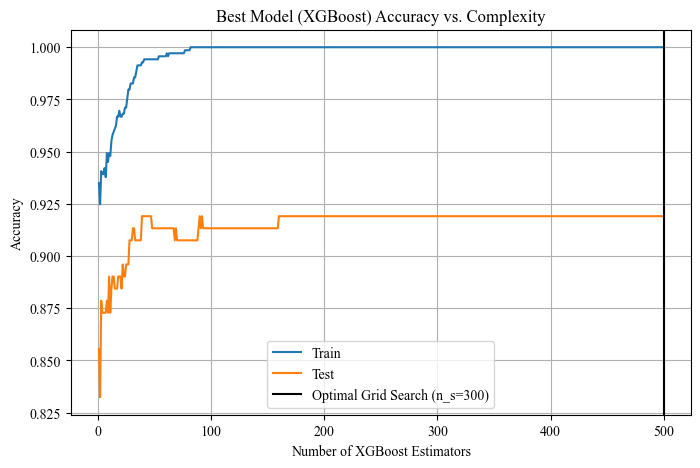

In [ ]:
# Plot
n_ests = list(range(1, max(n_estimators_range)))
plt.figure(figsize=(8, 5))
plt.plot(n_ests, train_acc, label='Train')
plt.plot(n_ests, test_acc, label='Test')
plt.axvline(best_params_xgb['n_estimators'], color='k', label='Optimal Grid Search (n_s=300)')
plt.xlabel('Number of XGBoost Estimators')
plt.ylabel('Accuracy')
plt.title("Best Model (XGBoost) Accuracy vs. Complexity")
plt.legend()
plt.grid(True)
plt.show()

#### Hubble Subclass (TT) Classifier

Lastly we attempted to train a model to classify the hubble subclasses, which corresponds to the `TT` response variable in our data set. This variable is much more sparse than the Hubble class, so we expected worse performance with this model (e.g. TT=2 has only two observations in the entire data set). Because of gradient boosting's ability to perform well on inbalanced data sets, and because of XGBoost's strong performance with classifying Hubble class, we attempted to model `TT` using the XGBoost classifier and tuning the same parameters as before with Cross Validation. We also implemented this model with and without Random Over Sampling to hopefully correct for some of the under-represented subclasses; we were unable to implement SMOTE because there were often insufficient samples to do so.

Below, we observe that the XGBoost model performs substantially better than the XGBoost model with ROS for both the test and validation accuracies. Additionally, the training curves that we plot as a function of complexity indicate that the model does indeed appear to become slightly overfit when the number of estimators goes above ~200. The verticle black line is the value that we choose, which does not seem to be in the overfit region!

In [ ]:
display(pd.DataFrame(TT_accuracies).T.sort_values(by="val", ascending=False))

,train,test,val
XGBoost,0.962,0.653,0.622
XGBoost-ROS,1.000,0.636,0.616


In [ ]:
best_params_XGBoost_TT = {
    'learning_rate': 0.1,
    'max_depth': 5,
    'n_estimators': 200
}

# Get the validation scores
n_estimators_range = grid_search_xgb_TT.cv_results_['param_estimator__n_estimators'].data.astype(np.int32)

train_acc = []
test_acc = []
train_acc_smote = []
test_acc_smote = []

# Iterate with increasing model complexity (n_estimators) and get the test and train accuracies
for n_ests in range(1, max(n_estimators_range)):

    # Get/fit model and get the test and train accuracies
    model = OneVsRestClassifier(XGBClassifier(random_state=109,
                               learning_rate=best_params_XGBoost_TT['learning_rate'],
                               max_depth=best_params_XGBoost_TT['max_depth'],
                               n_estimators=n_ests)).fit(X_train_std, y_train_TT)

    train_preds = model.predict(X_train_std)
    test_preds = model.predict(X_test_std)
    train_acc.append(accuracy_score(y_train_TT, train_preds))
    test_acc.append(accuracy_score(y_test_TT, test_preds))

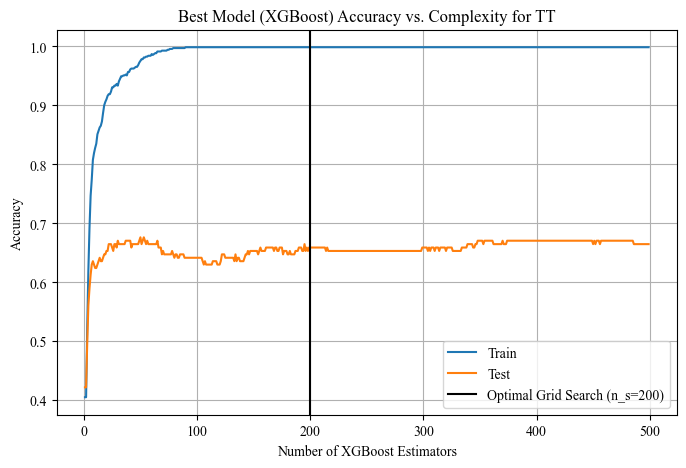

In [ ]:
# Plot
n_ests = list(range(1, max(n_estimators_range)))
plt.figure(figsize=(8, 5))
plt.plot(n_ests, train_acc, label='Train')
plt.plot(n_ests, test_acc, label='Test')
plt.axvline(best_params_XGBoost_TT['n_estimators'], color='k', label=f'Optimal Grid Search (n_s={best_params_XGBoost_TT["n_estimators"]})')
plt.xlabel('Number of XGBoost Estimators')
plt.ylabel('Accuracy')
plt.title("Best Model (XGBoost) Accuracy vs. Complexity for TT")
plt.legend()
plt.grid(True)
plt.show()

### 3e) Final Model Analysis and Flow Chart

#### Hubble class XGBoost Classifier

##### Confusion Matrix

Below, we show the confusion matrix and normalized confusion matrices for our tuned XGBoost classifier. The confusion matrix is done with our test data, and we perform quite well. We achieve 0.91, 0.71, and 0.96 accuracy for lenticular, spiral, and irregular galaxies, respectively. These accuracies seem to be somewhat correlated to the sample sizes of the classes---irregular has the most data points, then lenticular, then spiral.

We also see that the main source of error for our model is mistaking lenticular and spiral galaxies for irregulars. This is somewhat unsurprising because astronomers essentially label all the galaxies irregular that they can't into any other label. Thus, there should be some fuzziness in the borders between the categories, and many spirals/lenticulars should share some irregular qualities.

In [151]:
best_XGbooster = XGBClassifier(max_depth=best_params_xgb['max_depth'], learning_rate=best_params_xgb['learning_rate'], n_estimators=best_params_xgb['n_estimators'], random_state=109).fit(X_train_std, y_train_hubble)


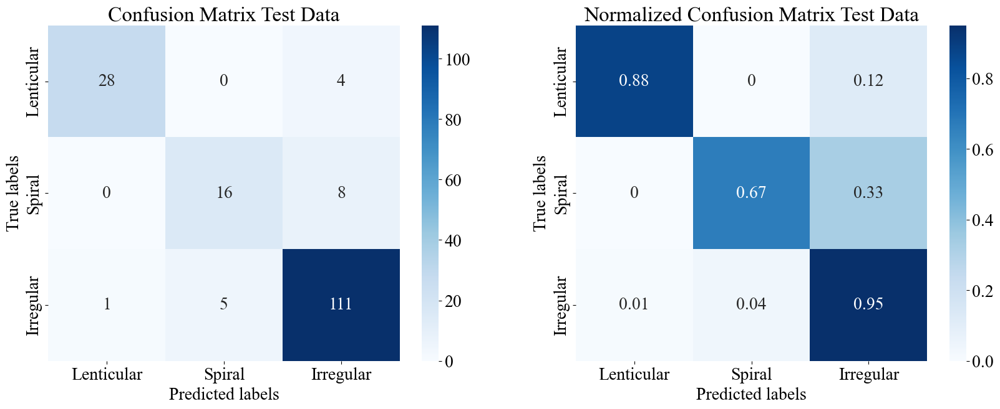

In [152]:
# Get predictions
preds = best_XGbooster.predict(X_test_std)

# Get confusion matrix
hub_unique_classes = np.unique(y_test_hubble)
cm = confusion_matrix(y_test_hubble, preds, labels=hub_unique_classes)
cm_sum = np.sum(cm, axis=1)
cm_acc = np.round(cm / np.atleast_2d(cm_sum).T, 2)

# Plot the confusion matrix
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7))
tick_labs = ['Lenticular', 'Spiral', 'Irregular']
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=tick_labs, yticklabels=tick_labs, ax=ax1)
ax1.set_xlabel('Predicted labels')
ax1.set_ylabel('True labels')
ax1.set_title('Confusion Matrix Test Data')

# Plot the normalized confusion matrix
sns.heatmap(cm_acc, annot=True, fmt='g', cmap='Blues', xticklabels=tick_labs, yticklabels=tick_labs, ax=ax2)
ax2.set_xlabel('Predicted labels')
ax2.set_ylabel('True labels')
ax2.set_title('Normalized Confusion Matrix Test Data')
plt.show()

##### ROC Curve

Below, we plot the Receiver Operating Characteristic (ROC) curve. We observe that our models performs quite well with all the different classes---they are all much farther towards the top left corner than the randomly classifying diagonal line. Interestingly, however, we observe that irregular seems to perform the worst, as it is lower than the other lines on average, and has a slightly lower AUC (0.953 irregular < 0.966 spiral < 0.976 lenticular). This indicates that although we seem to be classifying the vast majority of irregular galaxies as irregular, the purity of the sample is not great and we are getting a number of false positives! This is bad if we are using this classifier for an objective like identifying irregular galaxies.

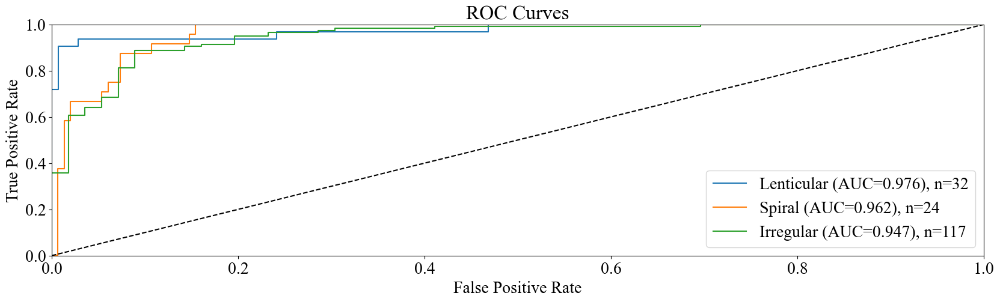

In [153]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Get probabilities for the positive class
y_scores = best_XGbooster.predict_proba(X_test_std)

# Binarize the output labels for multi-class (basically just one-hot-encoding)
y_test_binarized = label_binarize(y_test_hubble, classes=np.unique(y_test_hubble))

# Compute ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(3):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot
plt.figure()
for i, lab in enumerate(['Lenticular', 'Spiral', 'Irregular']):
    plt.plot(fpr[i], tpr[i], label=f'{lab} (AUC={roc_auc[i].round(3)}), n={sum(np.array(y_test_hubble) == i)}')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves')
plt.legend(loc="lower right")
plt.show()

##### Hubble Class Feature Importance

- a26: Major angular diameter
- FUV: Far UV
- Bmag: Apparent integral b-band magnitude
- Hamag: Integral H-alpha line emission magnitude
- Kmag: K-band magnitude
- HImag: HI 21cm line magnitude
- W50: HI Line width at 50% level from maximum
- Tdw: Dwarf galaxy surface brightness morphology
- HRV: Heliocentric radial velocity
- Dist: linear distance to galaxy from the sun
- A26: major linear diameter
- i: inclination of galaxy from the face on
- vAmp: amplitude of rotational velocity
- Bmu: average b-band surface brightness
- M26: log-mass with Holmberg radius
- MHI: log-Hydrogen mass
- Vlg: local group radial velocity
- Ti5: tidal index

Below, we plot the feature importance for our XGBoost classifier for the features listed above. We observe that mass, k-band magnitude, the log hydrogen mass, and far UV values are largely the most imporant values in order. This makes some senes. Essentially the models are saying that mass and brightness are very important in determining a galaxy's type, as well as the magnitude of the HI 21cm line. Breaking these down:
- Mass: Mass plays a very important role in galaxy formation and classification for a number of reasons. Larger masses can lead to the formation of spiral galaxies due to the influence of gravity on gas and dust, which can result in flattened, rotating disks. In contrast, smaller masses might lead to irregular or dwarf galaxies. Mass also effects the ease with wich galaxies can be disrupted by the gravitational pull of nearby ones -- smaller galaxies can more easily be deformed by tidal forces.
- Log Hydrgogen Mass: The fact that the magnitude of the H 21cm line is important is interesting. Historically, this line has been a very important feature in determining the star formation rate of a galaxy ([Yu et al. (2022)](https://iopscience.iop.org/article/10.3847/1538-4357/ac5f07), [Robertson & Krastov (2008)](https://iopscience.iop.org/article/10.1086/587796/fulltext/73260.text.html)). Thus a larger hydrogen mass could indeed be evidence of higher star formation rates in a galaxy, which is helpful in classiyfing it. This makes sense. Lenticular galaxies typically exhibit low star formation rates. They are characterized by older, red stars and lack the significant gas and dust needed for new star formation. On the other hand, spiral galaxies, unique due to their visible galactic arms/spirals, are known for their higher star formation rates (especially in the arms' regions). Irregular galaxies often show varied and sometimes high star formation rates, due in large part to the chaotic processes that form them causing a wide range of possible star formation rates. 
- FUV: FUV emission is predominantly produced by hot, young stars, typically less than a few hundred million years old. Therefore, the presence and intensity of FUV emission in a galaxy can indicate regions of recent star formation. This is particularly useful for identifying spiral and irregular galaxies, which often have ongoing star formation. In contrast, lenticular galaxies, which primarily consist of older stars, exhibit much weaker FUV emission.
- K-Band Mag: K-Band mag is one proxy for brightness, specifically brightness in the infrared. Young, massive stars are much brighter than older, smaller stars, and thus galaxies with active star formation, like spiral galaxies, tend to be brighter than those with older star populations, like lenticular ones.

Overall these results make sense. FUV, K-Band magnitude, and hydrogen are al somewhat related to star formation rate, and so overall our model is telling us that star formation rate and mass are the two most important features in determining a galaxy's classification. These results are actually the same as those determined by other astrophysicsts, such as [Conselice (2006)](https://academic.oup.com/mnras/article/373/4/1389/3101455) who argued that mass, star formation rate, and interaction/merger rates are the most important properties in determining galaxy class. Interestingly, the next most important feature in our model is Ti5, the tidal index, which is a measure of the galaxy environment and tidal effects (causing mergers/interactions) on a galaxy. 

Additionally, we observe that the HRV, Dist, Vlg, and i all have particularly low importances. This is to be expected because these values are generally more a result of selection bias from observing galaxies than they are intrinsic to the galaxies themselves. So, we would not expect them to be strongly correlated with galaxy morphology.


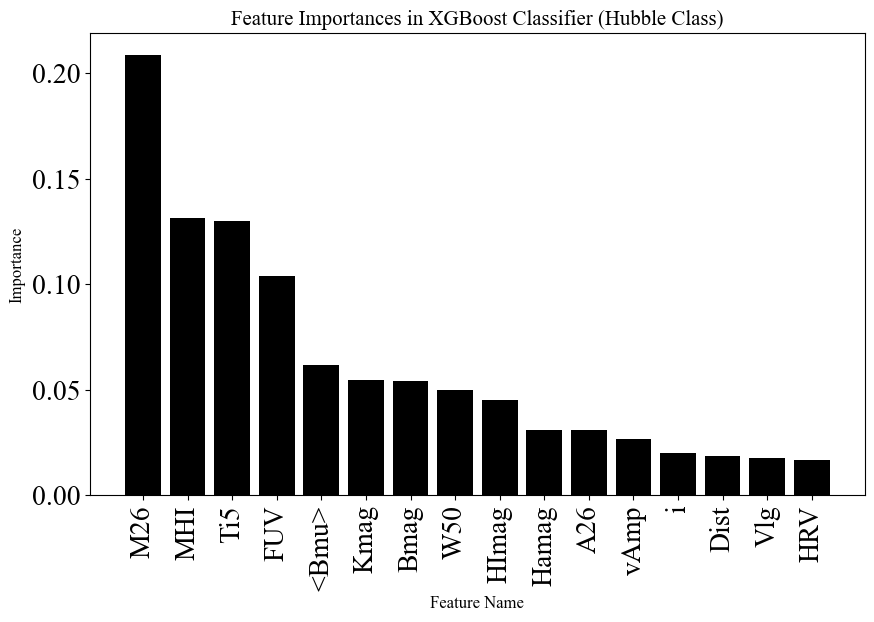

In [154]:
# Get feature importances
feature_importances = best_XGbooster.feature_importances_
sorted_indices = np.argsort(feature_importances)[::-1]

# Plotting
plt.figure(figsize=(10, 6))
plt.title("Feature Importances in XGBoost Classifier (Hubble Class)", fontsize=15)
plt.bar(range(len(sorted_indices)), feature_importances[sorted_indices], align='center', color='k')
plt.xticks(range(len(sorted_indices)), np.array(quant_preds)[sorted_indices], rotation=90)
plt.xlabel('Feature Name', fontsize=12)
plt.ylabel('Importance', fontsize=12)
plt.show()

##### TT Class XGBoost Confusion Matrices

In the confusion matrix below for the TT class, we see that our classifier does a fair job of classifying the test set---the general trend of classifications is along the diagonal which is encouraging because the TT values within each hubble class are ordinal descriptions of the galaxy morphology. In the left panel we observe that our dataset is actually extremely sparse, as many of the classes only have 1 or two values. This explains some of the inaccuracies in the middle range of numbers in the right graph.

In [ ]:
# Fit the best model based on the CV
base_best_XGbooster = XGBClassifier(max_depth=best_params_xgb_TT['estimator__max_depth'], learning_rate=best_params_xgb_TT['estimator__learning_rate'], n_estimators=best_params_xgb_TT['estimator__n_estimators'], random_state=109)
best_XGbooster_TT = OneVsRestClassifier(base_best_XGbooster).fit(X_train_std, y_train_TT)

/var/folders/8w/z7zsz3tj76jd_p19pfzbwj5c0000gn/T/ipykernel_43953/2589800907.py:8: RuntimeWarning: invalid value encountered in divide
  cm_acc = np.round(cm / np.atleast_2d(cm_sum).T, 2)


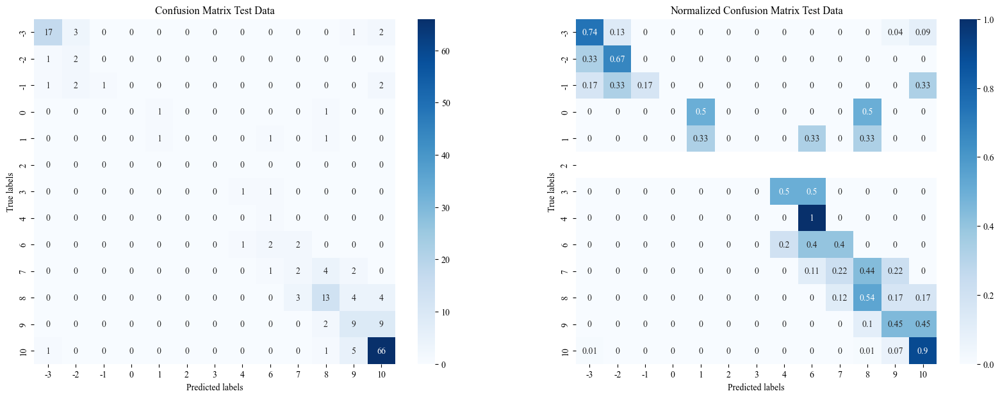

In [ ]:
# Get predictions
preds = best_XGbooster_TT.predict(X_test_std)

# Get confusion matrix
hub_unique_classes = np.unique(y_test_TT)
cm = confusion_matrix(y_test_TT, preds, labels=hub_unique_classes)
cm_sum = np.sum(cm, axis=1)
cm_acc = np.round(cm / np.atleast_2d(cm_sum).T, 2)

# Plot the confusion matrix
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7))
tick_labs = np.sort(np.unique(y_test_TT))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=tick_labs, yticklabels=tick_labs, ax=ax1)
ax1.set_xlabel('Predicted labels')
ax1.set_ylabel('True labels')
ax1.set_title('Confusion Matrix Test Data')

# Plot the normalized confusion matrix
sns.heatmap(cm_acc, annot=True, fmt='g', cmap='Blues', xticklabels=tick_labs, yticklabels=tick_labs, ax=ax2)
ax2.set_xlabel('Predicted labels')
ax2.set_ylabel('True labels')
ax2.set_title('Normalized Confusion Matrix Test Data')
plt.show()

##### TT Class XGBoost ROC Curve

The ROC curves for our models are fair. The majority of the models' curves are in the top left, with AUC>0.7. The 9 and 10 classes perform the worst, with AUCs of 0.574 and 0.563, respectively, which are definitely closer to random classifiers than the others. These two classes are both within the irregular Hubble class. This is interesting, as our model was able to predict the irregular class very well. The reason it likely fails is that the division between type 10 and and type 9 is that these two irregular types have little differentiating them from each other, as even for professional astronomers the line between these two is somewhat blurred. They are both strange looking galaxies, but it's hard to quantify the different kinds of 'strange' into just two categories. 

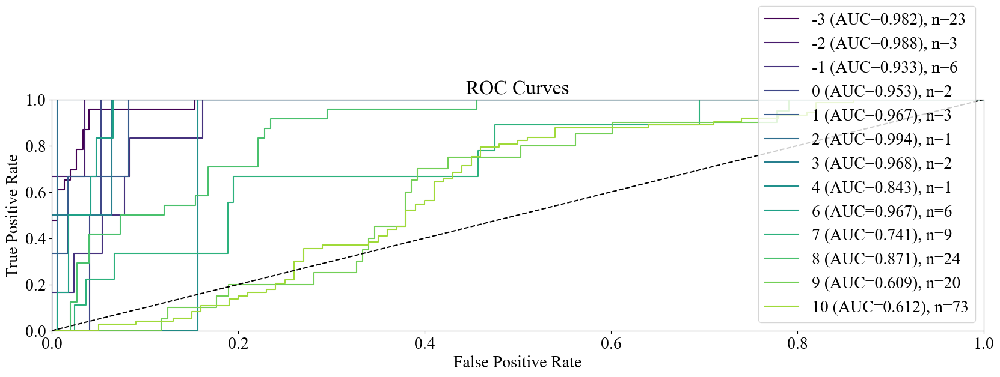

In [155]:
# Get probabilities for the positive class
y_scores = best_XGbooster_TT.predict_proba(X_test_std)

# Binarize the output labels for multi-class (basically just one-hot-encoding)
y_test_binarized = label_binarize(y_test_TT, classes=np.unique(y_test_TT))

# Compute ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(y_test_binarized.shape[1]):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot
plt.figure()
cmap = plt.get_cmap('viridis')
for i, lab in enumerate(np.sort(np.unique(y_test_TT))):
    plt.plot(fpr[i], tpr[i], label=f'{lab} (AUC={roc_auc[i].round(3)}), n={sum(np.array(y_test_TT) == lab)}', color=cmap(i/14))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves')
plt.legend(loc="lower right")
plt.show()

##### TT XGBoost Classifier Feature Importance

Below, we show the mean feature importances for the estimators across the OVR classifier. We also plot the Hubble class and TT class feature importances side by side. There are a number of similarities. We notice, however, the mass is relatively more important for the hubble classifier than the TT classifier. Also, Bmag and Kmag are relatively more important for the TT classifier than the Hubble classifier. Overall though, the most important features are still mass, and a variety of proxies for brightness (Kmab, Bmag, \<Bmag\>, FUV) which we discussed above, as well as MHI which is a useful tracker of SFR. These are similar to the important features from above.

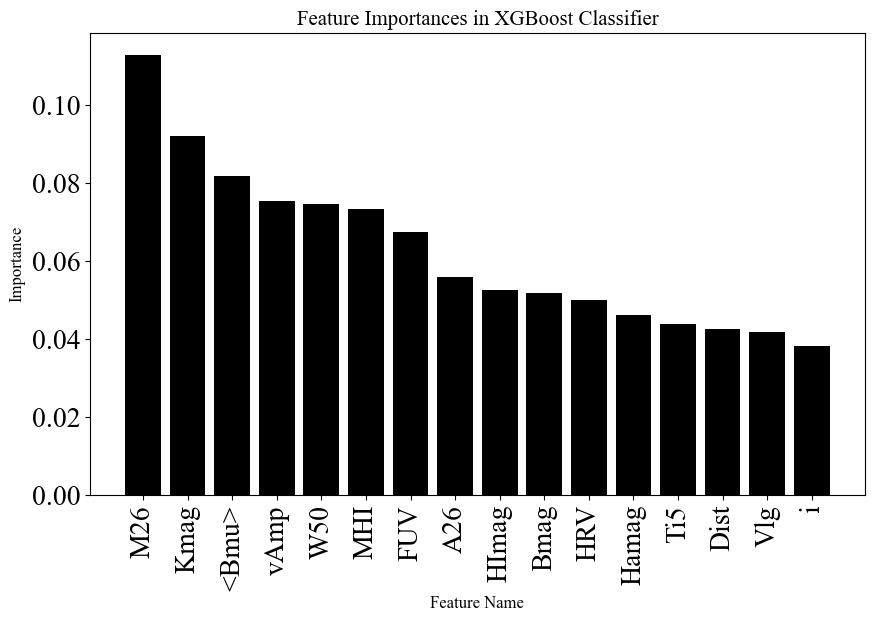

In [156]:
# Extracting feature importances from each classifier
importances = [est.feature_importances_ for est in best_XGbooster_TT.estimators_]
avg_importances = np.mean(importances, axis=0)

# Sorting the features by importance
sorted_idx = np.argsort(avg_importances)[::-1]
sorted_importances = avg_importances[sorted_idx]
sorted_features = [quant_preds[idx] for idx in sorted_idx]

# Plotting
plt.figure(figsize=(10, 6))
plt.title("Feature Importances in XGBoost Classifier", fontsize=15)
plt.bar(sorted_features, sorted_importances, align='center', color='k')
plt.xticks(range(len(sorted_indices)), np.array(quant_preds)[sorted_idx], rotation=90)
plt.xlabel('Feature Name', fontsize=12)
plt.ylabel('Importance', fontsize=12)
plt.show()

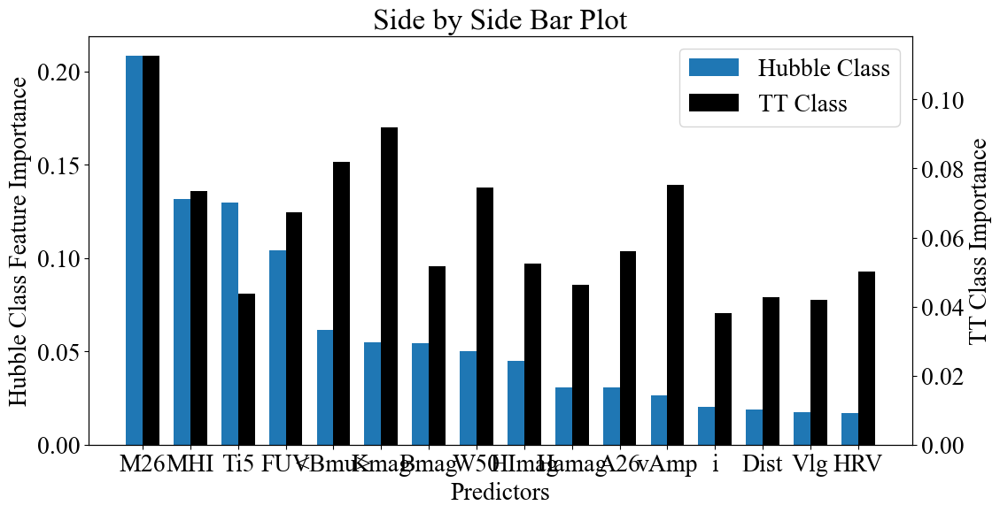

In [ ]:
TT_importances = np.mean([est.feature_importances_ for est in best_XGbooster_TT.estimators_], axis=0)
hubble_importances = best_XGbooster.feature_importances_
sorted_idxs = np.argsort(hubble_importances)[::-1]

# Positions of the bars on the x-axis
x = np.arange(len(quant_preds))
width = 0.35  # Width of the bars

# Plotting
fig, ax1 = plt.subplots(figsize=(12, 6))
ax1.bar(x - width/2, hubble_importances[sorted_idxs], width, label='Hubble Class')

# Adding labels and title
ax1.set_xlabel('Predictors')
ax1.set_ylabel('Hubble Class Feature Importance')
ax1.set_title('Side by Side Bar Plot')
ax1.set_xticks(x, quant_preds[sorted_idxs])
ax2 = ax1.twinx()
ax2.bar(x + width/2, TT_importances[sorted_idxs], width, label='TT Class', color='k')
ax2.set_ylabel('TT Class Importance')

# Gather the legend handles and labels from both axes
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2
ax1.legend(handles, labels, loc='upper right')

plt.show()

### 3f) Custom Model

Below, we implement our custom classifier. This classifier predicts TT class by first using the tuned Hubble classifier, and then using regression to predict the TT subclass. The motivation for this is that when TT is broken up into the hubble classes, it becomes an ordinal response variable. For example, the spiral subclass increases with the number of arms and extent of wrapped-ness the arms show. So, the classifier is made up of one XGBoost classifier that predicts the Hubble class, and then an XGBoost *regressor* that predicts the TT subclasses for Lenticular, Spiral and Irregular galaxies, respectively. We use the regressor to conduct prediction by rounding outputs to the nearest integer.

First, we tune the subclass classifiers with and without Random Over Sampling.

#### Custom Classifier without ROS

In [ ]:
# Parameters to tune with CV
param_grid = {"max_depth": [2, 3, 4, 5, 6], "learning_rate": [0.001, 0.01, 0.1, 1], "n_estimators": [10, 25, 50, 100, 110, 120, 130, 140, 150]}
print("Subclassifiers")

#### ================ Lenticular ================ ####
pipeline_lent = XGBRegressor(random_state=109)
lents = np.where(y_train_hubble == 0)[0]
grid_search_lent = GridSearchCV(pipeline_lent, param_grid, cv=10, scoring='neg_mean_squared_error').fit(X_train_std[lents], y_train_TT.to_numpy()[lents])
print("Lenticular Best Parameters, Score:", grid_search_lent.best_params_, round(-grid_search_lent.best_score_, 3))


#### ================ Spiral ================ ####
pipeline_spiral = XGBRegressor(random_state=109)

spirals = np.where(y_train_hubble == 1)[0]
grid_search_spiral = GridSearchCV(pipeline_spiral, param_grid, cv=10, scoring='neg_mean_squared_error').fit(X_train_std[spirals], y_train_TT.to_numpy()[spirals])
print("Spiral Best Parameters, Score:", grid_search_spiral.best_params_, round(-grid_search_spiral.best_score_, 3))

#### ================ Irregular ================ ####
pipeline_irreg = XGBRegressor(random_state=109)

irregs = np.where(y_train_hubble == 2)[0]
grid_search_irreg = GridSearchCV(pipeline_irreg, param_grid, cv=10, scoring='neg_mean_squared_error').fit(X_train_std[irregs], y_train_TT.to_numpy()[irregs])
print("Irregular Best Parameters, Score:", grid_search_irreg.best_params_, round(-grid_search_irreg.best_score_, 3))

lenticular_kwargs = {
    'estimator': XGBRegressor,
    'n_estimators': grid_search_lent.best_params_['n_estimators'],
    'max_depth': grid_search_lent.best_params_['max_depth'],
    'learning_rate': grid_search_lent.best_params_['learning_rate']
}

spiral_kwargs = {
    'estimator': XGBRegressor,
    'n_estimators': grid_search_spiral.best_params_['n_estimators'],
    'max_depth': grid_search_spiral.best_params_['max_depth'],
    'learning_rate': grid_search_spiral.best_params_['learning_rate']
}

irregular_kwargs = {
    'estimator': XGBRegressor,
    'n_estimators': grid_search_irreg.best_params_['n_estimators'],
    'max_depth': grid_search_irreg.best_params_['max_depth'],
    'learning_rate': grid_search_irreg.best_params_['learning_rate']
}


Subclassifiers
Lenticular Best Parameters, Score: {'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 10} 0.607
Spiral Best Parameters, Score: {'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 25} 2.358
Irregular Best Parameters, Score: {'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 110} 0.278


#### Custom Classifier without ROS

In [ ]:
# Parameters to tune with CV
param_grid = {"classifier__max_depth": [2, 3, 4, 5, 6], "classifier__learning_rate": [0.001, 0.01, 0.1, 1], "classifier__n_estimators": [10, 25, 50, 100, 110, 120, 130, 140, 150]}
print("Subclassifiers with ROS")

#### ================ Lenticular ================ ####
pipeline_lent = Pipeline([
    ('ros', RandomOverSampler(random_state=109)),
    ('classifier', XGBRegressor(random_state=109))
])

lents = np.where(y_train_hubble == 0)[0]
grid_search_lent = GridSearchCV(pipeline_lent, param_grid, cv=10, scoring='neg_mean_squared_error').fit(X_train_std[lents], y_train_TT.to_numpy()[lents])
print("Lenticular Best Parameters, Score:", grid_search_lent.best_params_, round(-grid_search_lent.best_score_, 3))


#### ================ Spiral ================ ####
pipeline_spiral = Pipeline([
    ('ros', RandomOverSampler(random_state=109)),
    ('classifier', XGBRegressor(random_state=109))
])

spirals = np.where(y_train_hubble == 1)[0]
grid_search_spiral = GridSearchCV(pipeline_spiral, param_grid, cv=10, scoring='neg_mean_squared_error').fit(X_train_std[spirals], y_train_TT.to_numpy()[spirals])
print("Spiral Best Parameters, Score:", grid_search_spiral.best_params_, round(-grid_search_spiral.best_score_, 3))

#### ================ Irregular ================ ####
pipeline_irreg = Pipeline([
    ('ros', RandomOverSampler(random_state=109)),
    ('classifier', XGBRegressor(random_state=109))
])

irregs = np.where(y_train_hubble == 2)[0]
grid_search_irreg = GridSearchCV(pipeline_irreg, param_grid, cv=10, scoring='neg_mean_squared_error').fit(X_train_std[irregs], y_train_TT.to_numpy()[irregs])
print("Irregular Best Parameters, Score:", grid_search_irreg.best_params_, round(-grid_search_irreg.best_score_, 3))


lenticular_kwargs_ROS = {
    'estimator': XGBRegressor,
    'n_estimators': grid_search_lent.best_params_['classifier__n_estimators'],
    'max_depth': grid_search_lent.best_params_['classifier__max_depth'],
    'learning_rate': grid_search_lent.best_params_['classifier__learning_rate']
}

spiral_kwargs_ROS = {
    'estimator': XGBRegressor,
    'n_estimators': grid_search_spiral.best_params_['classifier__n_estimators'],
    'max_depth': grid_search_spiral.best_params_['classifier__max_depth'],
    'learning_rate': grid_search_spiral.best_params_['classifier__learning_rate']
}

irregular_kwargs_ROS = {
    'estimator': XGBRegressor,
    'n_estimators': grid_search_irreg.best_params_['classifier__n_estimators'],
    'max_depth': grid_search_irreg.best_params_['classifier__max_depth'],
    'learning_rate': grid_search_irreg.best_params_['classifier__learning_rate']
}


Subclassifiers with ROS
Lenticular Best Parameters, Score: {'classifier__learning_rate': 0.01, 'classifier__max_depth': 4, 'classifier__n_estimators': 130} 0.694
Spiral Best Parameters, Score: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__n_estimators': 25} 2.293
Irregular Best Parameters, Score: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 6, 'classifier__n_estimators': 50} 0.3


Now, we instantiate one of our custom models with the tuned classifiers. We consider tuning each of the subclassifiers with and without Random Over Sampling; it appears in the chart that the custom classifier with ROS performs better on the train and test set, which makes sense because of our inbalanced data set. We plot the confusion matrix for this custom classifier using the ROS trained subclassiiers. Specifically, we observe that the classifier struggles to predict basically all spiral TT values (which are in the range 0-7). We hypothesize that the reason this model does worse than the XGBoostClassifier model is because we are training three separate models on subsets of a dataset which is already small. Therefore, the models don't really have a large enough dataset to really learn what is going on with the dataset. This model could be promising and interesting to use if we had a large dataset. Specifically, it would give use which features are important for predicting TT from each Hubble class (i.e. for spiral galaxies, what features are most important for predicting TT). This would be interesting, as the TT means something different for each hubble subclass.

In [ ]:
import importlib
import modeling_utils
importlib.reload(modeling_utils)
from modeling_utils import Custom_Classifier

#### ========== Non-ROS ========== ####
# Instantiate the custom classifier and predict on test and train
Our_Classifier = Custom_Classifier(initial_classifier=best_XGbooster, lenticular_kwargs=lenticular_kwargs, spiral_kwargs=spiral_kwargs, irregular_kwargs=irregular_kwargs, oversample=False, random_state=109).fit(X_train_std, y_train_hubble, y_train_TT)
train_preds = Our_Classifier.predict(X_train_std)
test_preds = Our_Classifier.predict(X_test_std)

# Get accuracies
train_score = accuracy_score(y_train_TT, train_preds)
test_score = accuracy_score(y_test_TT, test_preds)
TT_accuracies['Custom_Classifier'] = {'train': train_score, 'test': test_score, 'val': np.NaN}

#### ========== Non-ROS ========== ####
# Instantiate the custom classifier and predict on test and train
Our_Classifier_ROS = Custom_Classifier(initial_classifier=best_XGbooster, lenticular_kwargs=lenticular_kwargs_ROS, spiral_kwargs=spiral_kwargs_ROS, irregular_kwargs=irregular_kwargs_ROS, oversample=True, random_state=109).fit(X_train_std, y_train_hubble, y_train_TT)
train_preds_ROS = Our_Classifier_ROS.predict(X_train_std)
test_preds_ROS = Our_Classifier_ROS.predict(X_test_std)

# Get accuracies
train_score_ROS = accuracy_score(y_train_TT, train_preds_ROS)
test_score_ROS = accuracy_score(y_test_TT, test_preds_ROS)
TT_accuracies['Custom_Classifier_ROS'] = {'train': train_score_ROS, 'test': test_score_ROS, 'val': np.NaN}


display(pd.DataFrame(TT_accuracies).T.sort_values(by="val", ascending=False))

,train,test,val
XGBoost,0.962,0.653,0.622
XGBoost-ROS,1.000,0.636,0.616
Custom_Classifier,0.795,0.595,NaN
Custom_Classifier_ROS,0.842,0.538,NaN


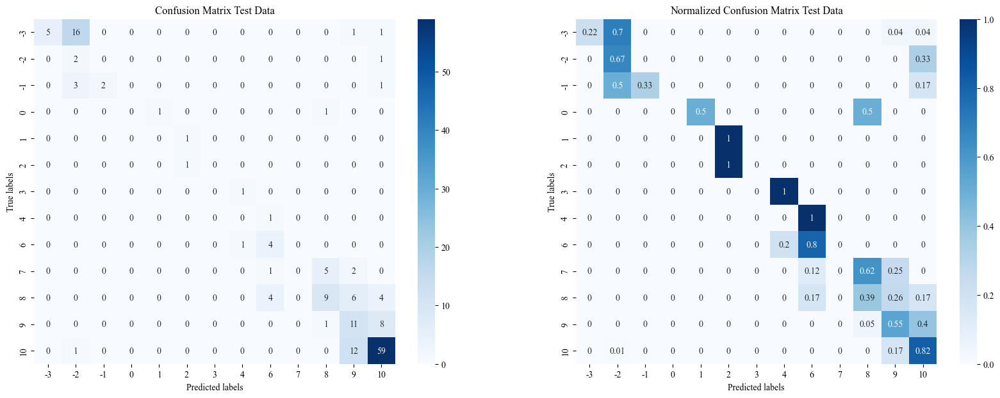

In [ ]:
# Get predictions
preds = Our_Classifier_ROS.predict(X_test_std)

# Get confusion matrix
hub_unique_classes = np.unique(y_test_TT)
cm = confusion_matrix(y_test_TT, preds, labels=hub_unique_classes)
cm_sum = np.sum(cm, axis=1)
cm_acc = np.round(cm / np.atleast_2d(cm_sum).T, 2)

# Plot the confusion matrix
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7))
tick_labs = np.sort(np.unique(y_test_TT))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=tick_labs, yticklabels=tick_labs, ax=ax1)
ax1.set_xlabel('Predicted labels')
ax1.set_ylabel('True labels')
ax1.set_title('Confusion Matrix Test Data')

# Plot the normalized confusion matrix
sns.heatmap(cm_acc, annot=True, fmt='g', cmap='Blues', xticklabels=tick_labs, yticklabels=tick_labs, ax=ax2)
ax2.set_xlabel('Predicted labels')
ax2.set_ylabel('True labels')
ax2.set_title('Normalized Confusion Matrix Test Data')
plt.show()

___

## 4. Results, Discussion, Future Considerations (Performance and feature selection; astrophysical relations; yadayadayada; Everyone)

In this notebook we've downloaded a database of galaxy properties and types, and trained a model to predict galaxy type from its properties. After a thorough pre-processing and exploratory data analysis, we selected the features we were going to use, imputed missing data, and rebalanced our dataset using SMOTE. We recovered known astronomical relationship from our data like the Hubble flow and determined physical significance behind the relationships of our different features. After this we tested three different models, XGBoost, Random Forest, and Logistic Regression. We tuned our models with cross-validation, and selected the best one as XGBoost. This was due to its high accuracy (around 90%) coupled with its computational efficiency. While our random forest model performed similary well, it took much longer to run. If we are hoping of scaling these models to much larger datasets, we want a model that scales easily and does not use too much computation power. We also built a custom pipeline of two different model classifiers, one to classify the Hubble class originally (lenticular, spiral, irregular) and then based off of that classification to determine the Hubble Type (from types -3 to 10). This model did not perform as well as we had hoped. One reason for this might be because we trained our second model on very small samples of just the hubble class, which is hard to learn accurate relations from. Another potential problem with this is the fact that there are now multiple points at which errors can be made; both in the initial sorting of a galaxy into Hubble class, and then the further sorting into Hubble type. 

After running our XGboost model, we were able to determine which features in galaxy classification were most important. We determined the most important feature to be overall mass, followed by hydrogen mass, and then different magnitudes (Kmag, Bmad, Hmag). These generally correspond to the size and SFR of different galaxies, which have been found to be the most important predictors in galaxy classification by previous studies. 

Future work would involve vastly improving the size of our dataset. With more time, it would be possible ti carry out our initial plan of cross matching the two databases we discuss in Section 1. This would give us around 22,000 galaxies to train our data on, an increase in our sample size by a factor of 20. We could also train more complex models on this larger dataset, such as Neural Networks, which might deliver better results. Getting a larger amount of spiral galaxies to more evenly balance our dataset will also be very important in training a reliable model, so that we avoid the need to synthetically produce so many. Overall though, our models show that it is possible to accurately predict a galaxy type from its features, and that these features have physical signficance when thinking about their astrophysical importance.



___

Thank you very much for reading through this notebook, and learning more about galaxy classfication with us! We hope you gained a deeper appreciation for what kinds of properties are important in determining a galaxy's type, as well as the astrophysical importance behind them. 